# FGSM & iFGSM & C&W Attack (Local WSL Version)

In [31]:

import sys
import os
import torch
import hashlib
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np
import pandas as pd
import copy
from torchvision import datasets, transforms
from torch.utils.data import TensorDataset, DataLoader

# 將本地路徑加入 sys.path 以載入自定義模組
sys.path.append(os.path.abspath('./mnist'))

from fgsm_attack import FGSMAttack, SparseFGSMAttack
from ifgsm_attack import IFGSMAttack 
from cw_attack import CWAttack
from models.mnist_net import mnistNet

In [32]:
def get_device():
    """取得最佳運算裝置 (CUDA 或 CPU)"""
    return torch.device("cuda" if torch.cuda.is_available() else "cpu")

def load_model(model_path, device):
    """載入模型與權重"""
    print(f"Loading model from {model_path}...")
    model = mnistNet().to(device)
    if os.path.exists(model_path):
        model.load_state_dict(torch.load(model_path, map_location=device))
        print("Model loaded successfully.")
    else:
        print("Warning: Model file not found, using uninitialized weights.")
    model.eval()
    return model

def get_test_dataloader(data_path='./mnist/data', batch_size=512):
    """載入 MNIST 測試集並優化傳輸效能"""
    t = transforms.Compose([transforms.ToTensor()])
    dataset = datasets.FashionMNIST(data_path, train=False, download=True, transform=t)
    
    dataloader = torch.utils.data.DataLoader(
        dataset, 
        batch_size=batch_size, 
        num_workers=4,      # 使用 4 個 CPU 線程準備數據
        pin_memory=True,    # 加速將數據從記憶體搬移到 GPU 顯存
        shuffle=False
    )
    return dataloader

def run_attack(attack_class, model, epsilons, dataloader, device, target=None, **kwargs):
    """執行指定的對抗樣本攻擊"""
    print(f"\n--- Running {attack_class.__name__} ---")
    attack = attack_class(model, epsilons, dataloader, device, target=target, **kwargs)
    attack.run()
    return attack




# 建立 Fashion MNIST 的標籤對應表
FASHION_LABELS = {
    0: 'T-shirt/top',
    1: 'Trouser',
    2: 'Pullover',
    3: 'Dress',
    4: 'Coat',
    5: 'Sandal',
    6: 'Shirt',
    7: 'Sneaker',
    8: 'Bag',
    9: 'Ankle boot'
}

def visualize_results(attack):
    """繪製成功率與對抗樣本 (支援 Fashion MNIST 文字標籤)"""
    # 1. 繪製成功率折線圖 (維持原樣)
    attack.plot_success_rate()
    
    # 2. 重新定義對抗樣本的視覺化邏輯
    plt.figure(figsize=(15, 12)) # 稍微加大畫布以容納文字
    cnt = 0
    
    for eps, adv_examples in attack.adv_examples.items():
        for index, data in enumerate(adv_examples[:5]):
            cnt += 1
            plt.subplot(len(attack.epsilons), 5, cnt)
            plt.xticks([], [])
            plt.yticks([], [])
            
            if index == 0:
                plt.ylabel(f"Eps: {eps}", fontsize=14)
            
            orig_lbl, adv_lbl, adv_ex, orig_ex = data
            
            # 將數字轉換為文字
            orig_name = FASHION_LABELS.get(orig_lbl, str(orig_lbl))
            adv_name = FASHION_LABELS.get(adv_lbl, str(adv_lbl))
            
            separator = np.ones((28, 2))
            combined_img = np.concatenate((orig_ex, separator, adv_ex), axis=1)
            
            # 將標題換成服飾名稱 (使用換行 \n 避免文字太長重疊)
            plt.title(f"{orig_name}\n-> {adv_name}", fontsize=11)
            plt.imshow(combined_img, cmap="gray")
            
        cnt += 4
        cnt -= cnt % 5
        
    plt.tight_layout()
    plt.show()


In [33]:
# 初始化設定
device = get_device()
print(f"Using device: {device}")

# 🌟 改用 WSL 的相對路徑，指向 ./mnist/models/ 底下的新模型
pretrained_model_path = "./mnist/models/fashion_mnist_cnn_no_dropout.pt"
# 如果之後要測試有 Dropout 的版本，記得手動更換檔名：
# pretrained_model_path = "./mnist/models/fashion_mnist_cnn_with_dropout.pt"

model = load_model(pretrained_model_path, device)

# 修改這裡的參數
test_dataloader = get_test_dataloader('./mnist/data', batch_size=512)

Using device: cuda
Loading model from ./mnist/models/fashion_mnist_cnn_no_dropout.pt...
Model loaded successfully.



=== 顯示資料集中各類別的範例圖片 ===


findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because 

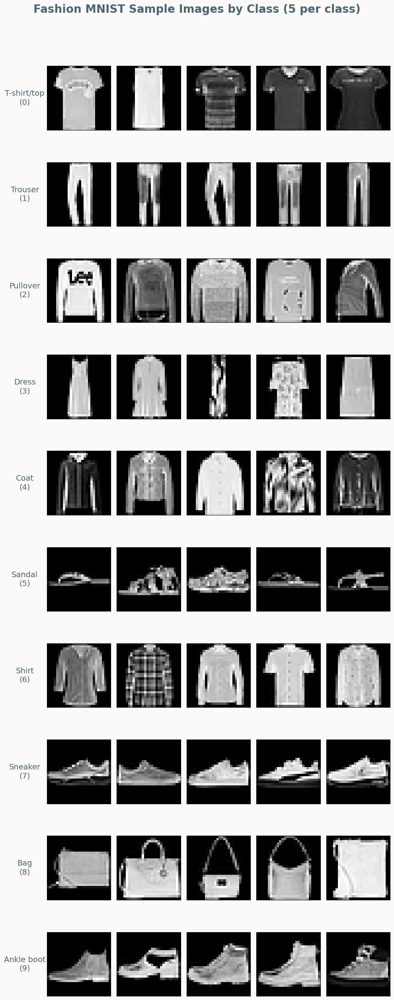

In [34]:
# === 印出各類別的多張代表性原圖 ===
def show_sample_images_per_class(dataloader, num_samples=5):
    """從測試集中找出每個類別的多張圖片並顯示"""
    class_images = {i: [] for i in range(10)}
    
    for data, target in dataloader:
        for i in range(len(target)):
            lbl = target[i].item()
            if len(class_images[lbl]) < num_samples:
                class_images[lbl].append(data[i].squeeze().numpy())
                
        # 檢查是否所有類別都收集夠了
        if all(len(imgs) == num_samples for imgs in class_images.values()):
            break
            
    plt.figure(figsize=(2 * num_samples, 2.5 * 10), facecolor='#FCF9F9')
    plt.suptitle(f'Fashion MNIST Sample Images by Class ({num_samples} per class)', fontsize=20, fontweight='bold', color='#4A6670', y=1.02)
    
    for lbl in range(10):
        class_name = FASHION_LABELS.get(lbl, str(lbl))
        for col in range(num_samples):
            plt.subplot(10, num_samples, lbl * num_samples + col + 1)
            plt.imshow(class_images[lbl][col], cmap='gray')
            if col == 0:
                plt.ylabel(f"{class_name}\n({lbl})", fontsize=14, color='#4A6670', rotation=0, labelpad=40, va='center')
            plt.xticks([])
            plt.yticks([])
            
    plt.tight_layout()
    plt.show()

print("\n=== 顯示資料集中各類別的範例圖片 ===")
show_sample_images_per_class(test_dataloader, num_samples=5)


In [35]:
# 初始化計數器
total_per_class = {i: 0 for i in range(10)}
correct_per_class = {i: 0 for i in range(10)}

model.eval()
with torch.no_grad():
    for data, target in test_dataloader:
        data, target = data.to(device), target.to(device)
        output = model(data)
        pred = output.argmax(dim=1)
        
        # 計算各類別總數與預測正確數
        for l in range(10):
            total_per_class[l] += (target == l).sum().item()
            correct_per_class[l] += ((target == l) & (pred == target)).sum().item()
print("=== Fashion MNIST 測試集統計 ===")
for l in range(10):
    class_name = FASHION_LABELS.get(l, str(l))
    print(f"[{l}] {class_name:12s}: 總共 {total_per_class[l]} 張, 預測正確 {correct_per_class[l]} 張")

/home/karla/miniconda3/envs/fgsm_mnist/lib/python3.10/site-packages/torch/nn/modules/dropout.py:176: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  return F.dropout2d(input, self.p, self.training, self.inplace)


=== Fashion MNIST 測試集統計 ===
[0] T-shirt/top : 總共 1000 張, 預測正確 886 張
[1] Trouser     : 總共 1000 張, 預測正確 985 張
[2] Pullover    : 總共 1000 張, 預測正確 867 張
[3] Dress       : 總共 1000 張, 預測正確 944 張
[4] Coat        : 總共 1000 張, 預測正確 880 張
[5] Sandal      : 總共 1000 張, 預測正確 973 張
[6] Shirt       : 總共 1000 張, 預測正確 798 張
[7] Sneaker     : 總共 1000 張, 預測正確 980 張
[8] Bag         : 總共 1000 張, 預測正確 971 張
[9] Ankle boot  : 總共 1000 張, 預測正確 970 張


=== 開始執行 FGSM 攻擊 ===

--- Running FGSMAttack ---
Epsilon: 0.01	Attack Success Rate = 2039 / 9254 = 0.2203
Epsilon: 0.02	Attack Success Rate = 3316 / 9254 = 0.3583
Epsilon: 0.03	Attack Success Rate = 4142 / 9254 = 0.4476
Epsilon: 0.04	Attack Success Rate = 4774 / 9254 = 0.5159
Epsilon: 0.05	Attack Success Rate = 5353 / 9254 = 0.5785
Epsilon: 0.06	Attack Success Rate = 5843 / 9254 = 0.6314
Epsilon: 0.07	Attack Success Rate = 6253 / 9254 = 0.6757
Epsilon: 0.08	Attack Success Rate = 6600 / 9254 = 0.7132
Epsilon: 0.09	Attack Success Rate = 6911 / 9254 = 0.7468


findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because 

Epsilon: 0.1	Attack Success Rate = 7136 / 9254 = 0.7711

=== 提取的 FGSM ASR 數據 ===
{0.01: 0.22033715150205316, 0.02: 0.3583315323103523, 0.03: 0.4475902312513508, 0.04: 0.5158850226928896, 0.05: 0.578452561054679, 0.06: 0.6314026366976443, 0.07: 0.6757078020315539, 0.08: 0.7132051004970823, 0.09: 0.7468121893235358, 0.1: 0.7711259995677545}

=== 成功提取對比圖素材 ===
原預測: 9, 攻擊後預測: 0
原圖 shape: (28, 28), 對抗樣本圖 shape: (28, 28)


findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because 

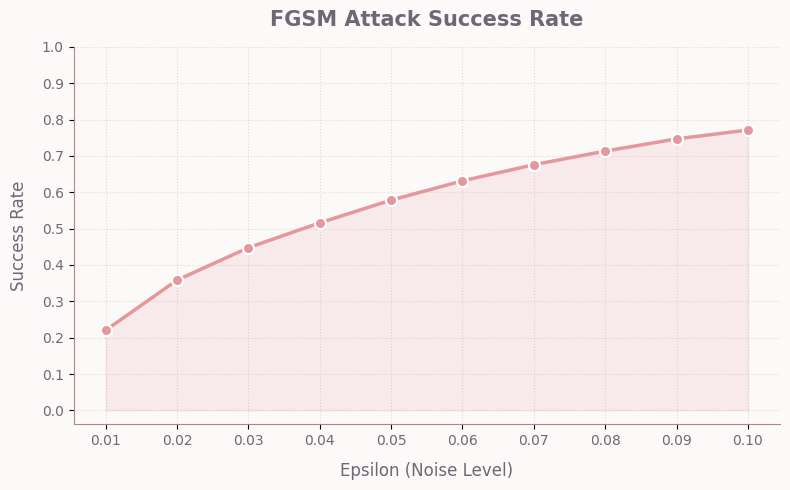

findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because 

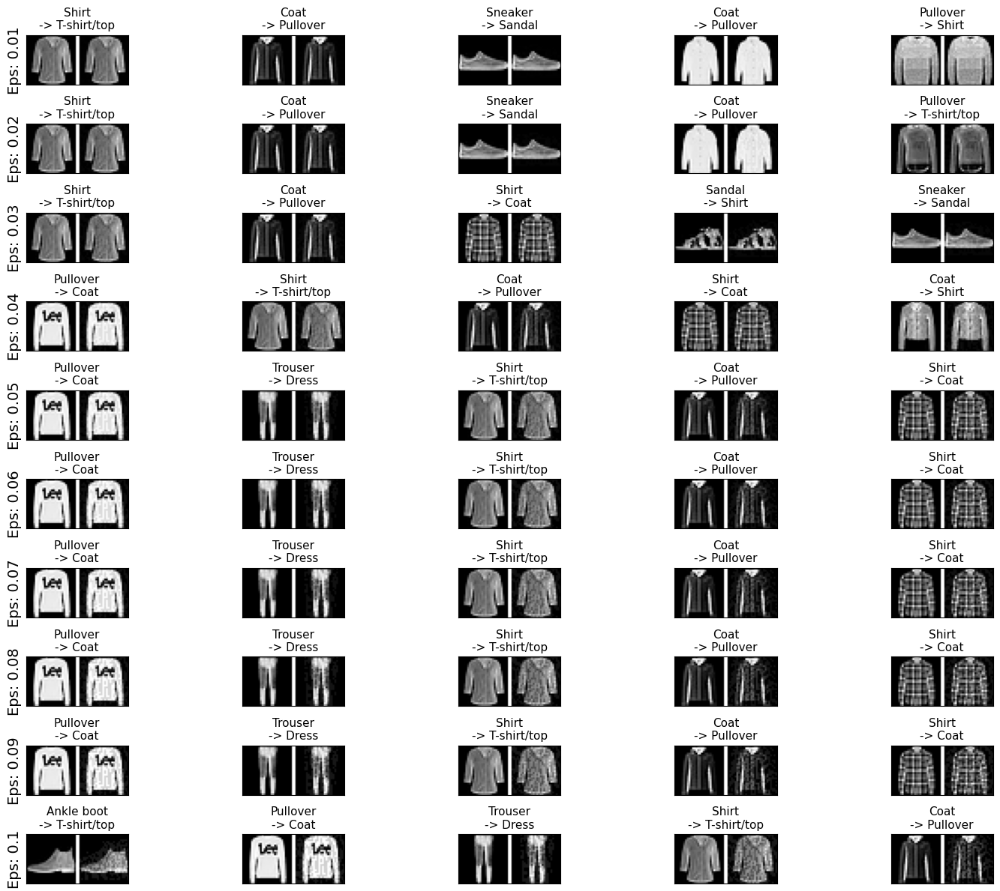

In [36]:
# --- 測試標準 FGSM 攻擊 ---
print("=== 開始執行 FGSM 攻擊 ===")
epsilons = [0.01, 0.02, 0.03, 0.04, 0.05, 0.06, 0.07, 0.08, 0.09, 0.1]
fgsm_attack = run_attack(FGSMAttack, model, epsilons, test_dataloader, device)

# 1. 提取 ASR 數據 (供多模型圖表整合使用)
fgsm_asr_data = fgsm_attack.get_asr_data()
print("\n=== 提取的 FGSM ASR 數據 ===")
print(fgsm_asr_data)

# 2. 提取對比圖素材 (供報告使用)
example_images = fgsm_attack.get_example_images(epsilon=0.1, num_images=1)
if example_images:
    init_p, adv_p, orig_img, adv_img = example_images[0]
    print(f"\n=== 成功提取對比圖素材 ===")
    print(f"原預測: {init_p}, 攻擊後預測: {adv_p}")
    print(f"原圖 shape: {orig_img.shape}, 對抗樣本圖 shape: {adv_img.shape}")

# 3. 測試視覺化與存圖功能
visualize_results(fgsm_attack)

=== 開始執行 iFGSM 攻擊 ===

--- Running IFGSMAttack ---


/home/karla/miniconda3/envs/fgsm_mnist/lib/python3.10/site-packages/torch/nn/modules/dropout.py:176: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  return F.dropout2d(input, self.p, self.training, self.inplace)


Epsilon: 0.01	Iter: 10	Attack Success Rate = 2423 / 9254 = 0.2618
Epsilon: 0.02	Iter: 10	Attack Success Rate = 4355 / 9254 = 0.4706
Epsilon: 0.03	Iter: 10	Attack Success Rate = 5657 / 9254 = 0.6113
Epsilon: 0.04	Iter: 10	Attack Success Rate = 6766 / 9254 = 0.7311
Epsilon: 0.05	Iter: 10	Attack Success Rate = 7705 / 9254 = 0.8326
Epsilon: 0.06	Iter: 10	Attack Success Rate = 8406 / 9254 = 0.9084
Epsilon: 0.07	Iter: 10	Attack Success Rate = 8781 / 9254 = 0.9489
Epsilon: 0.08	Iter: 10	Attack Success Rate = 8990 / 9254 = 0.9715
Epsilon: 0.09	Iter: 10	Attack Success Rate = 9064 / 9254 = 0.9795


findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because 

Epsilon: 0.1	Iter: 10	Attack Success Rate = 9090 / 9254 = 0.9823

=== iFGSM ASR 數據 ===
{0.01: 0.2618327209855198, 0.02: 0.47060730494921116, 0.03: 0.6113032202290901, 0.04: 0.7311432893883726, 0.05: 0.832612924140912, 0.06: 0.9083639507240112, 0.07: 0.9488869677977091, 0.08: 0.9714717959801167, 0.09: 0.9794683380159931, 0.1: 0.9822779338664361}


findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because 

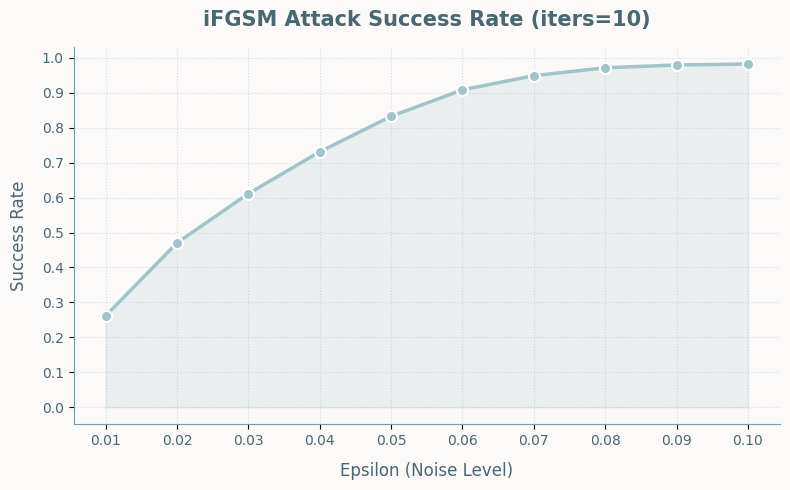

findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because 

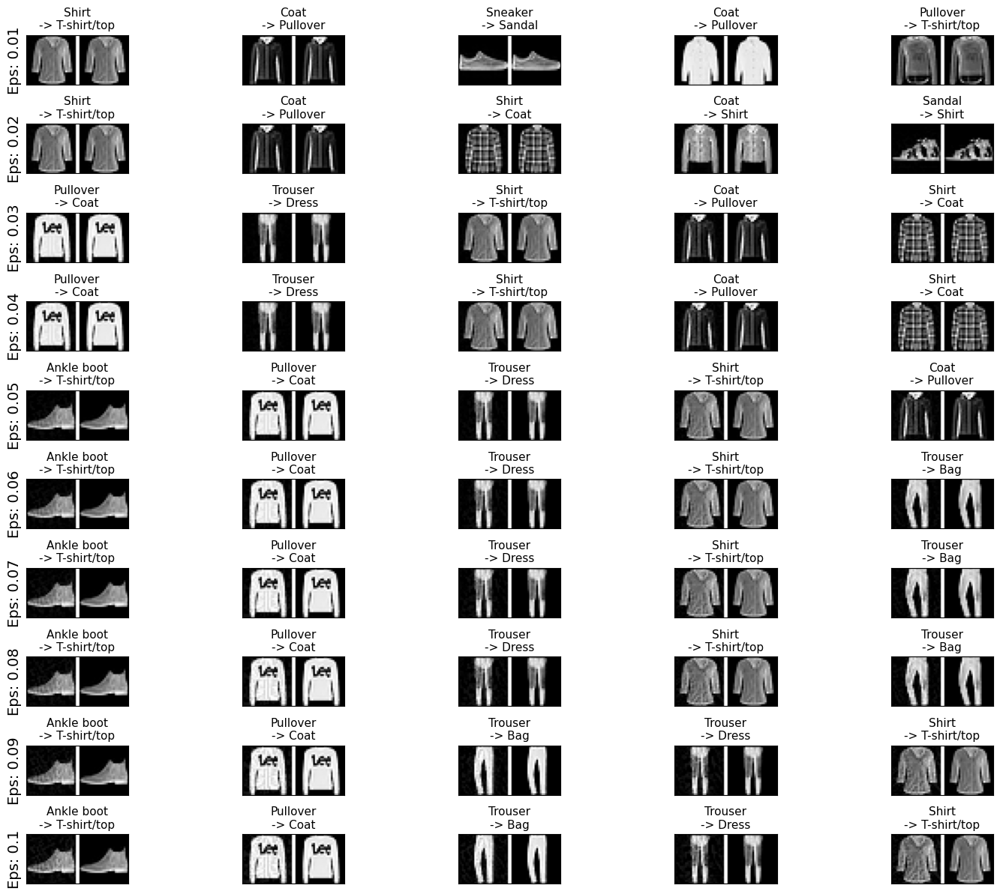

In [37]:
# --- 測試 iFGSM 攻擊 ---
print("=== 開始執行 iFGSM 攻擊 ===")
# 使用跟 FGSM 一樣的 epsilon，迭代次數設為 10
epsilons = [0.01, 0.02, 0.03, 0.04, 0.05, 0.06, 0.07, 0.08, 0.09, 0.1]
ifgsm_attack = run_attack(IFGSMAttack, model, epsilons, test_dataloader, device, iters=10)

# 1. 提取 iFGSM ASR 數據
ifgsm_asr_data = ifgsm_attack.get_asr_data()
print("\n=== iFGSM ASR 數據 ===")
print(ifgsm_asr_data)

# 2. 測試視覺化與存圖功能
visualize_results(ifgsm_attack)

=== 開始執行 C&W 攻擊 ===

--- Running CWAttack ---


/home/karla/miniconda3/envs/fgsm_mnist/lib/python3.10/site-packages/torch/nn/modules/dropout.py:176: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  return F.dropout2d(input, self.p, self.training, self.inplace)


Epsilon: 0.01	Iter: 50	Attack Success Rate = 2575 / 9254 = 0.2783
Epsilon: 0.02	Iter: 50	Attack Success Rate = 5085 / 9254 = 0.5495
Epsilon: 0.03	Iter: 50	Attack Success Rate = 7054 / 9254 = 0.7623
Epsilon: 0.04	Iter: 50	Attack Success Rate = 8634 / 9254 = 0.9330
Epsilon: 0.05	Iter: 50	Attack Success Rate = 9153 / 9254 = 0.9891
Epsilon: 0.06	Iter: 50	Attack Success Rate = 9236 / 9254 = 0.9981
Epsilon: 0.07	Iter: 50	Attack Success Rate = 9251 / 9254 = 0.9997
Epsilon: 0.08	Iter: 50	Attack Success Rate = 9254 / 9254 = 1.0000
Epsilon: 0.09	Iter: 50	Attack Success Rate = 9254 / 9254 = 1.0000


findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because 

Epsilon: 0.1	Iter: 50	Attack Success Rate = 9254 / 9254 = 1.0000

=== C&W ASR 數據 ===
{0.01: 0.2782580505727253, 0.02: 0.549492111519343, 0.03: 0.7622649665009725, 0.04: 0.9330019451048195, 0.05: 0.9890858007348173, 0.06: 0.9980548951804625, 0.07: 0.9996758158634104, 0.08: 1.0, 0.09: 1.0, 0.1: 1.0}


findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because 

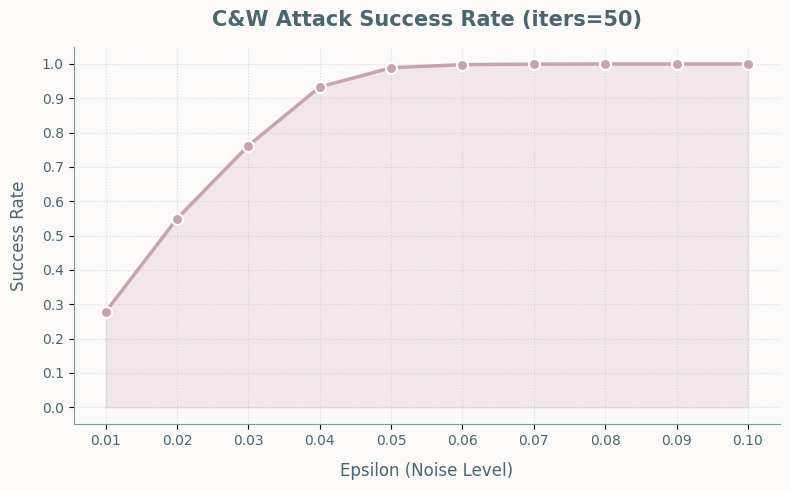

findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because 

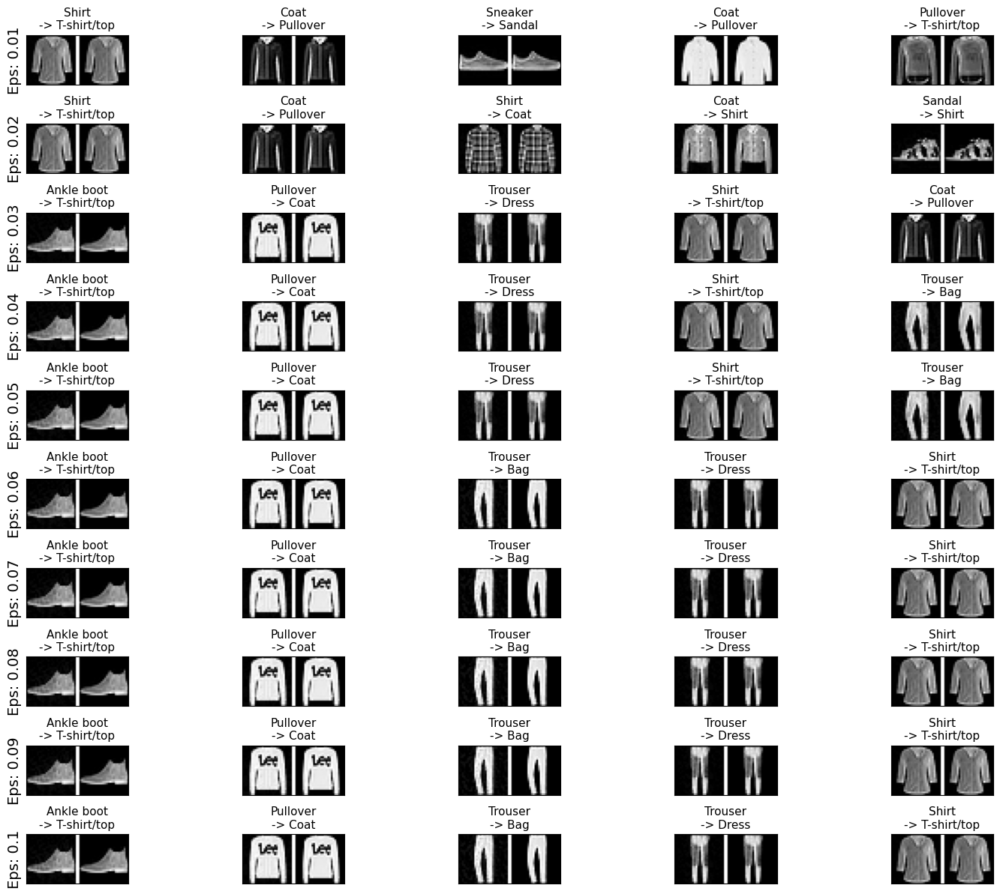

In [38]:
# --- 測試 C&W L_inf 攻擊 ---
print("=== 開始執行 C&W 攻擊 ===")
# 使用與前兩個攻擊相同的 epsilon
epsilons = [0.01, 0.02, 0.03, 0.04, 0.05, 0.06, 0.07, 0.08, 0.09, 0.1]

# C&W 的迭代次數 (iters) 通常會比 iFGSM 多一點效果才會出來，這裡先設 50 步
cw_attack = run_attack(CWAttack, model, epsilons, test_dataloader, device, iters=50, lr=0.01)

# 1. 提取 C&W ASR 數據
cw_asr_data = cw_attack.get_asr_data()
print("\n=== C&W ASR 數據 ===")
print(cw_asr_data)

# 2. 測試視覺化與存圖功能
visualize_results(cw_attack)

findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because 

findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because 

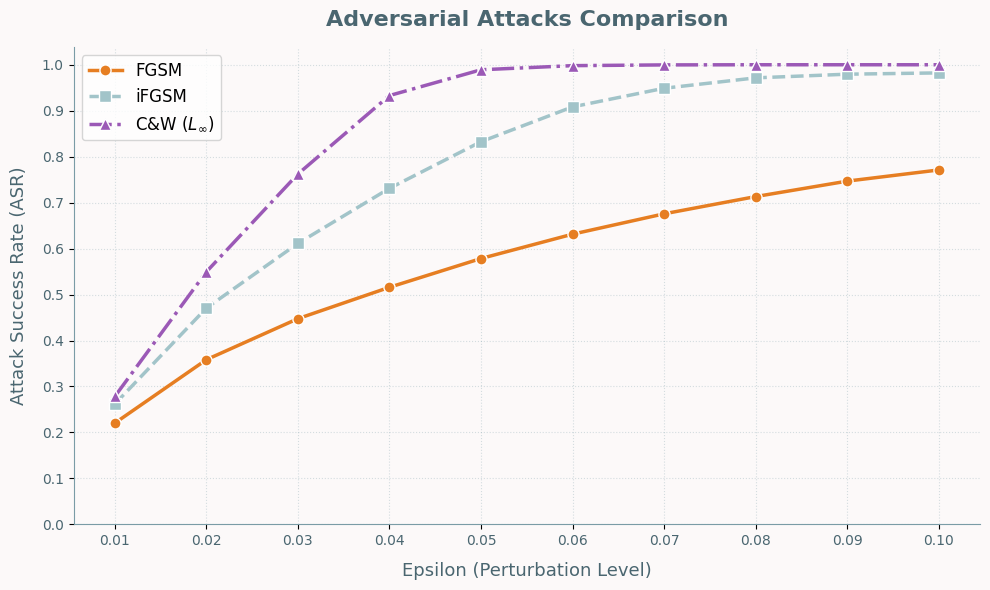

✅ 圖表已成功繪製並儲存至 ./0424/data/img/all_attacks_comparison.png


In [39]:
# 提取 Epsilon (X軸)
epsilons = list(fgsm_asr_data.keys())

# 提取 ASR (Y軸)
fgsm_asr = list(fgsm_asr_data.values())
ifgsm_asr = list(ifgsm_asr_data.values())
cw_asr = list(cw_asr_data.values())

# 繪製折線圖
plt.figure(figsize=(10, 6), facecolor='#FCF9F9')
ax = plt.gca()
ax.set_facecolor('#FCF9F9')
text_color = '#4A6670'

# FGSM 線 (橘紅色)
plt.plot(epsilons, fgsm_asr, marker="o", linestyle="-", label="FGSM",
         color="#E67E22", linewidth=2.5, markersize=8, markeredgecolor='white')
# iFGSM 線 (湖水藍)
plt.plot(epsilons, ifgsm_asr, marker="s", linestyle="--", label="iFGSM",
         color="#A2C4C9", linewidth=2.5, markersize=8, markeredgecolor='white')
# C&W 線 (紫色)
plt.plot(epsilons, cw_asr, marker="^", linestyle="-.", label="C&W ($L_{\infty}$)",
         color="#9B59B6", linewidth=2.5, markersize=8, markeredgecolor='white')

# 標題與軸標籤
plt.title("Adversarial Attacks Comparison", fontsize=16, fontweight='bold', color=text_color, pad=15)
plt.xlabel("Epsilon (Perturbation Level)", fontsize=13, color=text_color, labelpad=10)
plt.ylabel("Attack Success Rate (ASR)", fontsize=13, color=text_color, labelpad=10)

# 軸刻度與網格
plt.xticks(epsilons, color=text_color)
plt.yticks([i / 10.0 for i in range(11)], color=text_color)
plt.grid(True, linestyle=":", color="#7A9CA6", alpha=0.3, zorder=1)
plt.legend(fontsize=12)

# 去除邊框
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_color('#7A9CA6')
ax.spines['bottom'].set_color('#7A9CA6')

# 存檔與顯示
plt.tight_layout()
plt.savefig("./all_attacks_comparison.png", dpi=300, facecolor='#FCF9F9')
plt.show()

print("✅ 圖表已成功繪製並儲存至 ./0424/data/img/all_attacks_comparison.png")

/home/karla/miniconda3/envs/fgsm_mnist/lib/python3.10/site-packages/torch/nn/modules/dropout.py:176: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  return F.dropout2d(input, self.p, self.training, self.inplace)
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Mic

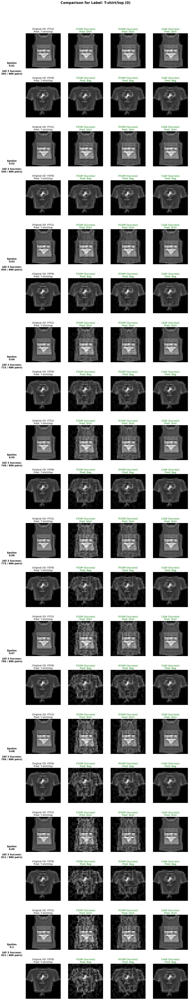

findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because 

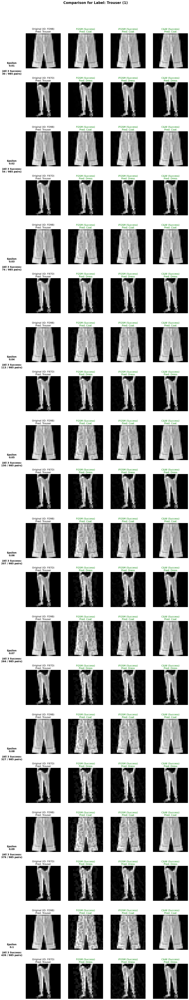

findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because 

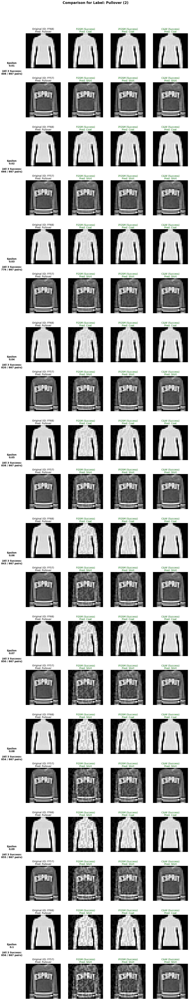

findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because 

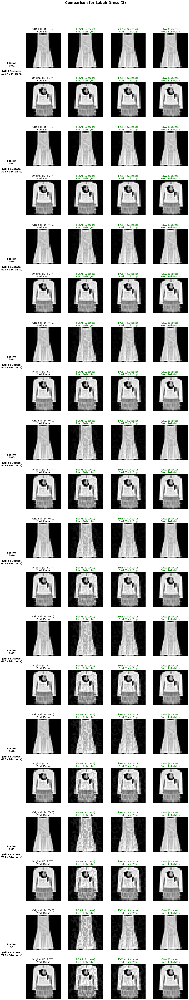

findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because 

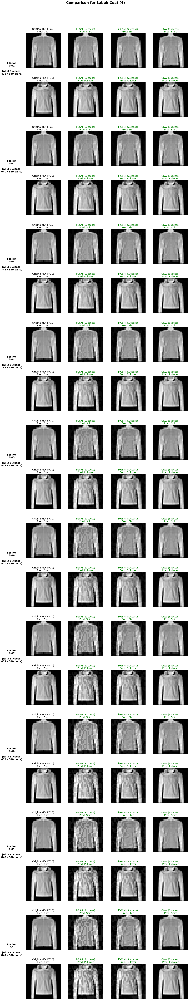

findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because 

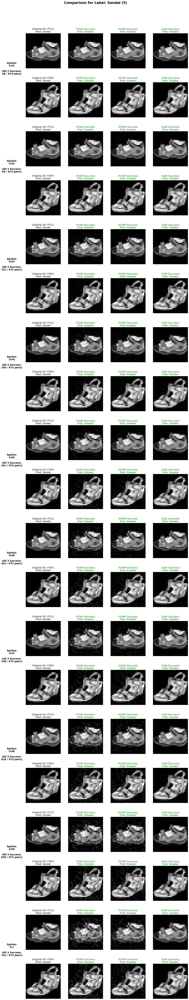

findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because 

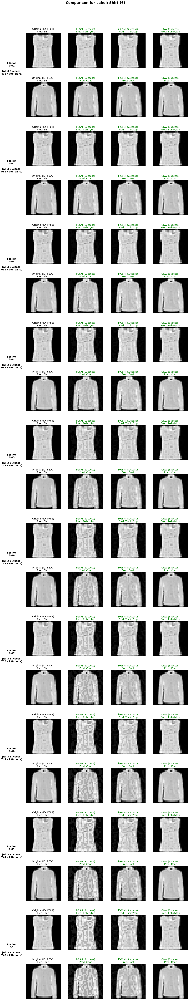

findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because 

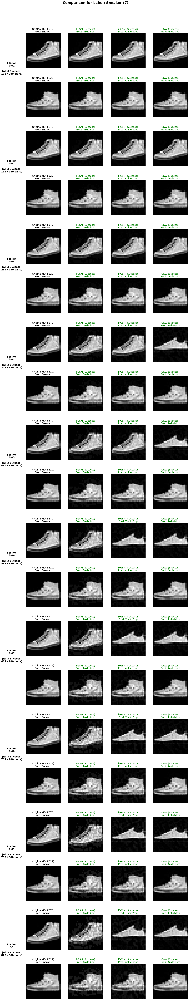

findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because 

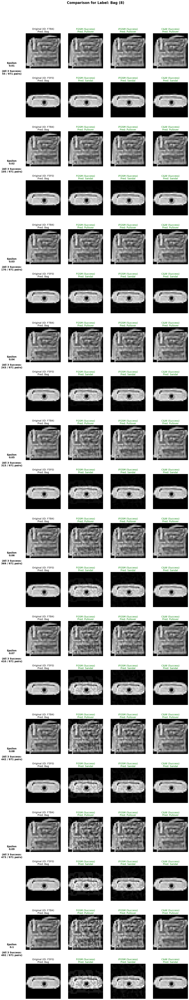

findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because 

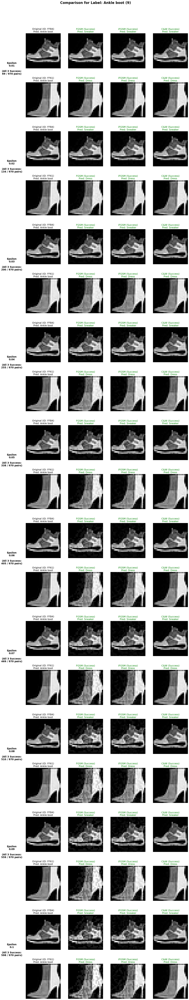

In [40]:
# 建立 Fashion MNIST 的標籤對應表
FASHION_LABELS = {
    0: 'T-shirt/top',
    1: 'Trouser',
    2: 'Pullover',
    3: 'Dress',
    4: 'Coat',
    5: 'Sandal',
    6: 'Shirt',
    7: 'Sneaker',
    8: 'Bag',
    9: 'Ankle boot'
}

def get_image_id(img):
    """
    利用圖片像素內容產生一組簡短的唯一編號。
    為了避免浮點數的微小誤差造成誤判，先轉換為 uint8  再進行 hash。
    """
    img_array = (np.array(img).squeeze() * 255).astype(np.uint8)
    return hashlib.md5(img_array.tobytes()).hexdigest()[:4].upper()

def plot_all_epsilons_by_label(fgsm_attack, ifgsm_attack, cw_attack, model, test_dataloader, device, 
                               epsilons=[0.01, 0.02, 0.03, 0.04, 0.05, 0.06, 0.07, 0.08, 0.09,0.1], 
                               labels=range(10)):
    # 預先計算各類別在未受攻擊前，模型就預測正確的樣本數量
    correct_per_class = {i: 0 for i in labels}
    model.eval()
    with torch.no_grad():
        for data, target in test_dataloader:
            data, target = data.to(device), target.to(device)
            output = model(data)
            pred = output.argmax(dim=1)
            correct_mask = (pred == target)
            for l in labels:
                correct_per_class[l] += ((target == l) & correct_mask).sum().item()

    # 遍歷每一個 label (0 ~ 9)
    for label in labels:
        total_correct = correct_per_class[label]
        class_name = FASHION_LABELS.get(label, str(label))
        
        # 收集所有 epsilon 下的攻擊結果，並以 img_id 為鍵進行全域統計
        global_img_dict = {}
        eps_3_success_counts = {}
        
        for eps in epsilons:
            fgsm_exs = fgsm_attack.get_example_images(epsilon=eps, num_images=10000)
            ifgsm_exs = ifgsm_attack.get_example_images(epsilon=eps, num_images=10000)
            cw_exs = cw_attack.get_example_images(epsilon=eps, num_images=10000)
            
            fgsm_cands = [ex for ex in (fgsm_exs or []) if ex[0] == label]
            ifgsm_cands = [ex for ex in (ifgsm_exs or []) if ex[0] == label]
            cw_cands = [ex for ex in (cw_exs or []) if ex[0] == label]
            
            eps_img_dict = {}
            def add_to_dict(cands, attack_name):
                for ex in cands:
                    orig_img = np.array(ex[2])
                    img_id = get_image_id(orig_img)
                    
                    if img_id not in eps_img_dict:
                        eps_img_dict[img_id] = set()
                    eps_img_dict[img_id].add(attack_name)
                    
                    if img_id not in global_img_dict:
                        global_img_dict[img_id] = {'orig': orig_img, 'init_p': ex[0], 'attacks': {}}
                    if eps not in global_img_dict[img_id]['attacks']:
                        global_img_dict[img_id]['attacks'][eps] = {}
                    global_img_dict[img_id]['attacks'][eps][attack_name] = ex
                    
            add_to_dict(fgsm_cands, 'FGSM')
            add_to_dict(ifgsm_cands, 'iFGSM')
            add_to_dict(cw_cands, 'C&W')
            
            eps_3_success_counts[eps] = sum(1 for v in eps_img_dict.values() if len(v) == 3)
            
        # 選出 2 個最佳的 img_id
        # 評分標準：在各個 epsilon 和各種攻擊中成功的總次數 (最高 15)
        scored_ids = []
        for img_id, info in global_img_dict.items():
            score = sum(len(atk_dict) for eps, atk_dict in info['attacks'].items())
            scored_ids.append((score, img_id))
            
        scored_ids.sort(key=lambda x: (x[0], x[1]), reverse=True)
        top_2_ids = [x[1] for x in scored_ids[:2]]
        
        if not top_2_ids:
            print(f"Label {class_name} ({label}) has no successful attacks at all.")
            continue
            
        # 建立畫布 (10 列 x 4 欄)
        nrows = len(epsilons) * len(top_2_ids) 
        fig, axes = plt.subplots(nrows, 4, figsize=(16, 4 * nrows), squeeze=False)
        fig.suptitle(f"Comparison for Label: {class_name} ({label})", fontsize=20, fontweight='bold', y=1.02)
        
        row_idx = 0
        for eps in epsilons:
            for i, img_id in enumerate(top_2_ids):
                eps_3_success_count = eps_3_success_counts[eps]
                
                if i == 0:
                    y_pos = 0.0 if len(top_2_ids) > 1 else 0.5
                    axes[row_idx][0].text(-0.4, y_pos, f"Epsilon\n{eps}\n\n(All 3 Success:\n{eps_3_success_count} / {total_correct} pairs)", 
                        va='center', ha='center', 
                        transform=axes[row_idx][0].transAxes, 
                        fontsize=14, fontweight='bold')
                
                if img_id not in global_img_dict:
                    for j in range(4):
                        axes[row_idx][j].axis('off')
                        if j == 0:
                            axes[row_idx][j].text(0.5, 0.5, 'No image found', ha='center', va='center', fontsize=14, color='gray')
                    row_idx += 1
                    continue
                    
                info = global_img_dict[img_id]
                init_p = info['init_p']
                orig_img = info['orig']
                attacks_at_eps = info['attacks'].get(eps, {})
                init_name = FASHION_LABELS.get(init_p, str(init_p))
                
                axes[row_idx][0].imshow(orig_img.squeeze(), cmap='gray')
                axes[row_idx][0].set_title(f"Original (ID: {img_id})\nPred: {init_name}", fontsize=14)
                axes[row_idx][0].axis('off')
                
                attack_names = ['FGSM', 'iFGSM', 'C&W']
                for j, atk_name in enumerate(attack_names):
                    ax = axes[row_idx][j+1]
                    if atk_name in attacks_at_eps:
                        ex = attacks_at_eps[atk_name]
                        adv_p = ex[1]
                        adv_img = np.array(ex[3]).squeeze()
                        adv_name = FASHION_LABELS.get(adv_p, str(adv_p))
                        
                        ax.imshow(adv_img, cmap='gray')
                        ax.set_title(f"{atk_name} (Success)\nPred: {adv_name}", fontsize=14, color='green')
                    else:
                        ax.imshow(orig_img.squeeze(), cmap='gray')
                        ax.set_title(f"{atk_name} (Failed)\nPred: {init_name}", fontsize=14, color='red')
                    ax.axis('off')
                    
                row_idx += 1
                
        plt.tight_layout()
        plt.show()

# 執行函式
plot_all_epsilons_by_label(fgsm_attack, ifgsm_attack, cw_attack, model, test_dataloader, device)


findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because 

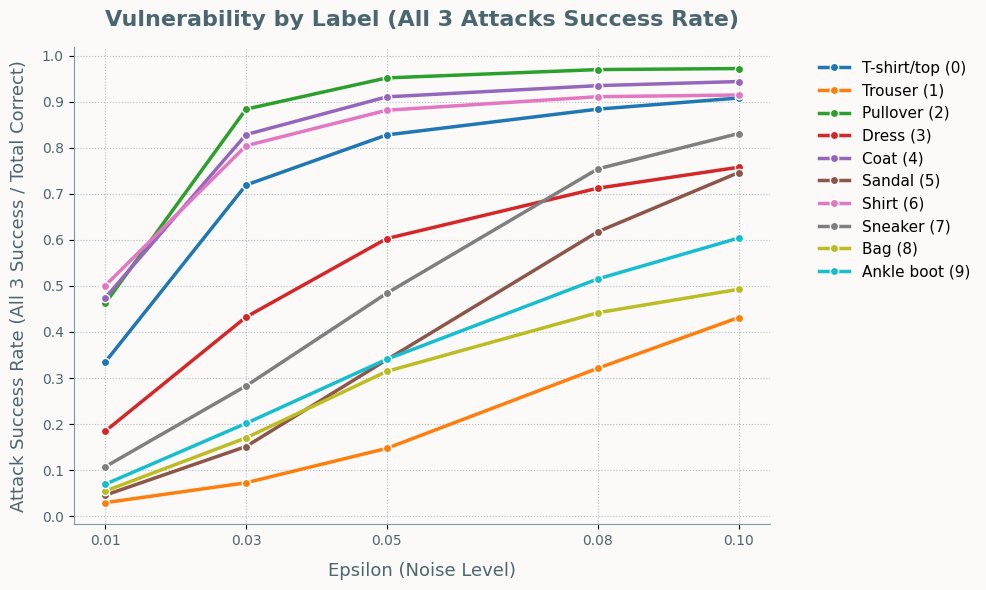

In [41]:
# === 繪製各個 Label 在不同 Epsilon 下「三種攻擊皆成功」的比例變化折線圖 ===
def plot_all_3_success_trend(fgsm_attack, ifgsm_attack, cw_attack,
                             model, test_dataloader, device, 
                             epsilons=[0.01, 0.03, 0.05, 0.08, 0.1], 
                             labels=range(10)):
    
    # 預先計算各類別在未受攻擊前，模型就預測正確的樣本數量 (作為分母)
    correct_per_class = {i: 0 for i in labels}
    model.eval()
    with torch.no_grad():
        for data, target in test_dataloader:
            data, target = data.to(device), target.to(device)
            output = model(data)
            pred = output.argmax(dim=1)
            correct_mask = (pred == target)
            for l in labels:
                correct_per_class[l] += ((target == l) & correct_mask).sum().item()
    
    for l in labels:
       correct_per_class[l] += ((target == l) &
    correct_mask).sum().item()
    stats = {lbl: [] for lbl in labels}
    
    for eps in epsilons:
        # 取得當前 eps 的所有對抗樣本 (上限 10000 確保涵蓋全部)
        fgsm_exs = fgsm_attack.get_example_images(epsilon=eps, num_images=10000)
        ifgsm_exs = ifgsm_attack.get_example_images(epsilon=eps, num_images=10000)
        cw_exs = cw_attack.get_example_images(epsilon=eps, num_images=10000)
        
        for label in labels:
            fgsm_cands = [ex for ex in (fgsm_exs or []) if ex[0] == label]
            ifgsm_cands = [ex for ex in (ifgsm_exs or []) if ex[0] == label]
            cw_cands = [ex for ex in (cw_exs or []) if ex[0] == label]
            
            img_dict = {}
            def add_to_dict(cands, attack_name):
                for ex in cands:
                    orig_img = np.array(ex[2])
                    # 使用 hash 確保是同一張原圖
                    img_id = hashlib.md5((orig_img * 255).astype(np.uint8).tobytes()).hexdigest()[:6]
                    if img_id not in img_dict:
                        img_dict[img_id] = set()
                    img_dict[img_id].add(attack_name)
                    
            add_to_dict(fgsm_cands, 'FGSM')
            add_to_dict(ifgsm_cands, 'iFGSM')
            add_to_dict(cw_cands, 'C&W')
            
            # 計算 3 種攻擊都同時成功的圖片數量 (分子)
            all_3_count = sum(1 for v in img_dict.values() if len(v) == 3)
            
            # 轉換為百分比 (比例: 所有三種皆成功 / 原本正確預測數量)
            total_correct = correct_per_class[label]
            ratio = all_3_count / total_correct if total_correct > 0 else 0
            stats[label].append(ratio)
            
    # 開始繪圖
    plt.figure(figsize=(10, 6), facecolor='#FCF9F9')
    ax = plt.gca()
    ax.set_facecolor('#FCF9F9')
    
    # 取得 10 種不同的顏色，讓 10 條線有較高辨識度
    colors = cm.tab10(np.linspace(0, 1, 10))
    
    for label in labels:
        class_name = FASHION_LABELS.get(label, str(label))
        plt.plot(epsilons, stats[label], marker='o', label=f'{class_name} ({label})', 
                 color=colors[label], linewidth=2.5, markersize=6, markeredgecolor='white')
                 
    plt.title('Vulnerability by Label (All 3 Attacks Success Rate)', fontsize=16, fontweight='bold', color='#4A6670', pad=15)
    plt.xlabel('Epsilon (Noise Level)', fontsize=13, color='#4A6670', labelpad=10)
    plt.ylabel('Attack Success Rate (All 3 Success / Total Correct)', fontsize=13, color='#4A6670', labelpad=10)
    
    plt.xticks(epsilons, color='#4A6670')
    # 設定 Y 軸為 0.0 ~ 1.0 的比例
    plt.yticks(np.arange(0.0, 1.1, 0.1), color='#4A6670')
    plt.grid(True, linestyle=':', alpha=0.6, color='#7A9CA6')
    
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['left'].set_color('#7A9CA6')
    ax.spines['bottom'].set_color('#7A9CA6')
    
    # 將圖例放到右側圖表外面，避免遮擋折線
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=11, frameon=False)
    
    plt.tight_layout()
    plt.savefig('./all_3_success_trend_by_label.png', dpi=1200, facecolor='#FCF9F9')
    plt.show()

# 執行函式 (記得現在需要多傳入 model, test_dataloader, device)
plot_all_3_success_trend(fgsm_attack, ifgsm_attack, cw_attack, model, test_dataloader, device)


--- Running SparseFGSMAttack ---
Epsilon: 0.01	Attack Success Rate = 159 / 9254 = 0.0172
Epsilon: 0.03	Attack Success Rate = 558 / 9254 = 0.0603
Epsilon: 0.05	Attack Success Rate = 908 / 9254 = 0.0981
Epsilon: 0.08	Attack Success Rate = 1332 / 9254 = 0.1439
Epsilon: 0.1	Attack Success Rate = 1531 / 9254 = 0.1654
Epsilon: 0.2	Attack Success Rate = 2130 / 9254 = 0.2302
Epsilon: 0.3	Attack Success Rate = 2427 / 9254 = 0.2623
Epsilon: 0.5	Attack Success Rate = 2749 / 9254 = 0.2971


findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because 

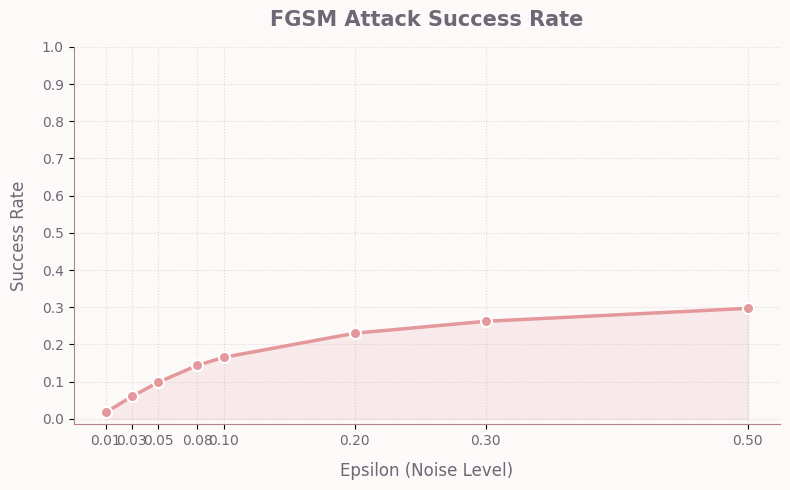

findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because 

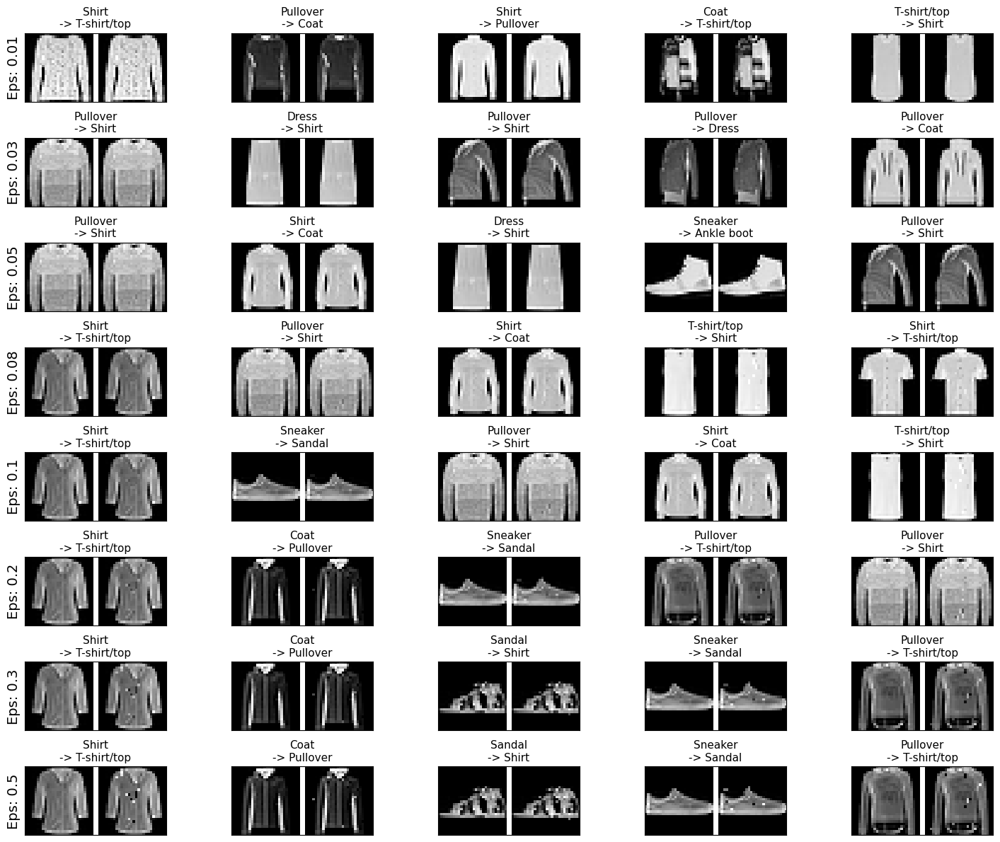

In [42]:
# 執行 Sparse FGSM 攻擊
sparse_epsilons = [0.01, 0.03, 0.05, 0.08, 0.1, 0.2, 0.3, 0.5]
max_pixels = 15
sparse_attack = run_attack(SparseFGSMAttack, model, sparse_epsilons, test_dataloader, device, max_pixels=max_pixels)
visualize_results(sparse_attack)


========== 對抗性微調 (Adversarial Fine-tuning - 分別訓練) ==========

--- 正在進行 FGSM 的對抗性微調 ---
🚩 FGSM: 對抗樣本 5353 筆 + 乾淨樣本 5353 筆。


/home/karla/miniconda3/envs/fgsm_mnist/lib/python3.10/site-packages/torch/nn/modules/dropout.py:176: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  return F.dropout2d(input, self.p, self.training, self.inplace)


Epoch 1/3, Loss: 8.4081
Epoch 2/3, Loss: 3.5342
Epoch 3/3, Loss: 1.9608
✅ FGSM 防禦模型已儲存至 ./mnist/models/fashion_mnist_defended_fgsm.pt

--- 正在進行 iFGSM 的對抗性微調 ---
🚩 iFGSM: 對抗樣本 7705 筆 + 乾淨樣本 7705 筆。
Epoch 1/3, Loss: 8.8508
Epoch 2/3, Loss: 2.3379
Epoch 3/3, Loss: 1.5026
✅ iFGSM 防禦模型已儲存至 ./mnist/models/fashion_mnist_defended_ifgsm.pt

--- 正在進行 CW 的對抗性微調 ---
🚩 CW: 對抗樣本 9153 筆 + 乾淨樣本 9153 筆。
Epoch 1/3, Loss: 2.9639
Epoch 2/3, Loss: 1.3576
Epoch 3/3, Loss: 0.9435
✅ CW 防禦模型已儲存至 ./mnist/models/fashion_mnist_defended_cw.pt

========== 產生 3x3 攻擊與防禦成效比較表 ==========
Loading model from ./mnist/models/fashion_mnist_cnn_no_dropout.pt...
Model loaded successfully.

正在評估 FGSM ...

--- Running FGSMAttack ---
Epsilon: 0.05	Attack Success Rate = 5353 / 9254 = 0.5785
Loading model from ./mnist/models/fashion_mnist_defended_fgsm.pt...
Model loaded successfully.

--- Running FGSMAttack ---
Epsilon: 0.05	Attack Success Rate = 5150 / 8607 = 0.5984

正在評估 iFGSM ...

--- Running IFGSMAttack ---
Epsilon: 0.05	Iter

findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because 


================= 最終 3x3 比較表 (eps=0.05) =================
|                     | FGSM   | iFGSM   | C&W    |
|:--------------------|:-------|:--------|:-------|
| Before Attack (Acc) | 92.54% | 92.54%  | 92.54% |
| After Attack (Acc)  | 39.01% | 15.49%  | 1.01%  |
| After Defense (Acc) | 34.57% | 29.29%  | 20.59% |



findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because 

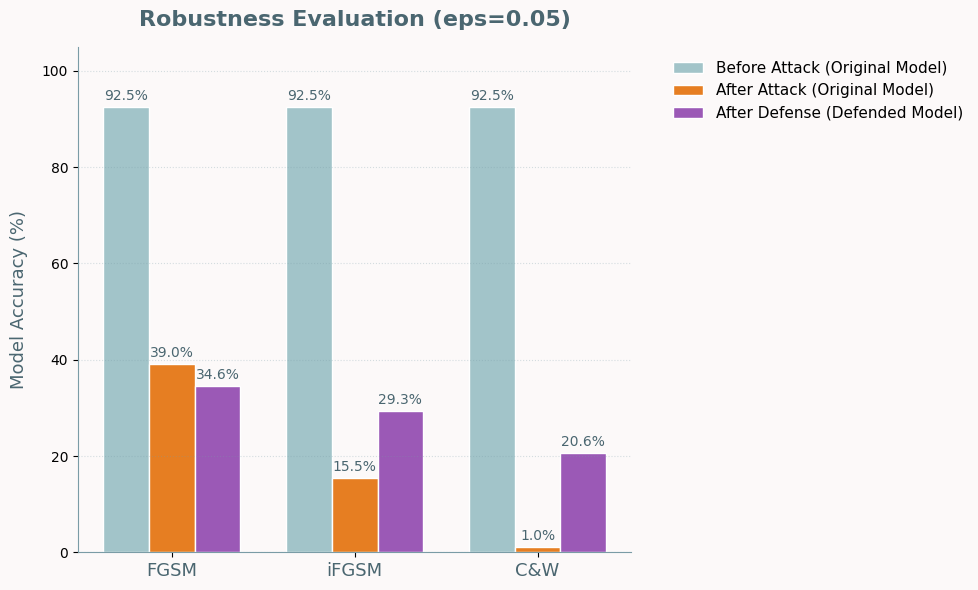

findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because 

✅ 3x3 比較圖表已儲存至 ./data/img/robustness_comparison.png


findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because 

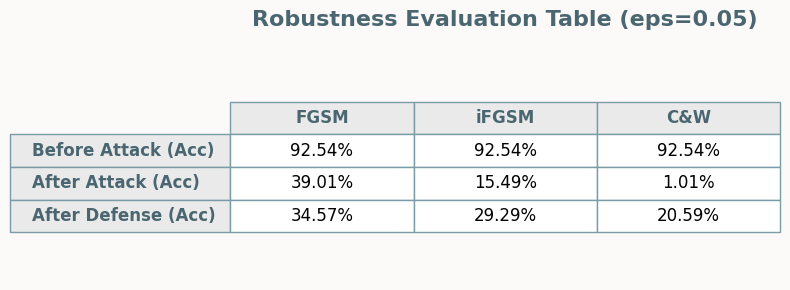

✅ 3x3 比較表格圖片已儲存至 ./data/img/robustness_table.png


In [43]:
#胡 test
print("\n========== 對抗性微調 (Adversarial Fine-tuning - 分別訓練) ==========")

train_eps = 0.05
attacks_dict = {
    "FGSM": fgsm_attack,
    "iFGSM": ifgsm_attack,
    "CW": cw_attack
}

# ⚠️ 注意：這裡需要您原本未受污染的原始模型 (model_orig)
# 確保每次微調都是從同樣的起跑點開始，而不是拿已經被污染的模型繼續訓練
# model_orig = load_model(...) 
model_orig = copy.deepcopy(model)
for atk_name, atk_obj in attacks_dict.items():
    print(f"\n--- 正在進行 {atk_name} 的對抗性微調 ---")
    
    # 1. 取得單一攻擊手法的對抗樣本
    adv_images, adv_labels = atk_obj.get_retrain_data(eps=train_eps)
    
    if adv_images is None or len(adv_images) == 0:
        print(f"❌ 找不到 {atk_name} 的對抗樣本，跳過。")
        continue

    # 2. 收集乾淨樣本 (最多 10000 筆)
    clean_images = []
    clean_labels = []
    for data, target in test_dataloader:
        clean_images.append(data)
        clean_labels.append(target)
        
    clean_images_tensor = torch.cat(clean_images, dim=0)
    clean_labels_tensor = torch.cat(clean_labels, dim=0)
    
    # 3. 強制 1:1 數量對齊 (取兩者中較小的數量，確保不失衡)
    min_size = min(len(adv_images), len(clean_images_tensor))
    
    adv_indices = torch.randperm(len(adv_images))[:min_size]
    clean_indices = torch.randperm(len(clean_images_tensor))[:min_size]
    
    final_adv_images = adv_images[adv_indices]
    final_adv_labels = adv_labels[adv_indices]
    final_clean_images = clean_images_tensor[clean_indices]
    final_clean_labels = clean_labels_tensor[clean_indices]
    
    print(f"🚩 {atk_name}: 對抗樣本 {min_size} 筆 + 乾淨樣本 {min_size} 筆。")
    
    mixed_images = torch.cat([final_adv_images, final_clean_images], dim=0)
    mixed_labels = torch.cat([final_adv_labels, final_clean_labels], dim=0)
    
    retrain_dataset = TensorDataset(mixed_images, mixed_labels)
    retrain_loader = DataLoader(retrain_dataset, batch_size=64, shuffle=True)
    
    # 4. 重新拷貝一個乾淨的模型進行訓練
    defended_model = copy.deepcopy(model_orig)
    defended_model.train()
    defended_model.to(device)
    
    optimizer = optim.Adam(defended_model.parameters(), lr=1e-4)
    criterion = nn.CrossEntropyLoss()
    
    epochs = 3
    for epoch in range(epochs):
        current_loss = 0.0
        for images, labels in retrain_loader:
            images, labels = images.to(device), labels.to(device)
            optimizer.zero_grad()
            outputs = defended_model(images)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()
            current_loss += loss.item()
        print(f"Epoch {epoch+1}/{epochs}, Loss: {current_loss/len(retrain_loader):.4f}")
        
    # 5. 獨立儲存該攻擊專屬的防禦模型
    save_path = f"./mnist/models/fashion_mnist_defended_{atk_name.lower()}.pt"
    torch.save(defended_model.state_dict(), save_path)
    print(f"✅ {atk_name} 防禦模型已儲存至 {save_path}")
 
 # 新增字體設定
plt.rcParams['font.sans-serif'] = ['Microsoft JhengHei']  # Windows 系統請用 'Microsoft JhengHei' (微軟正黑體)
# plt.rcParams['font.sans-serif'] = ['Arial Unicode MS']  # 如果您是 Mac 系統，請註解掉上一行，改用這行
plt.rcParams['axes.unicode_minus'] = False  # 確保圖表中的負號能正常顯示

# 新增字體設定
plt.rcParams['font.sans-serif'] = ['Microsoft JhengHei']  # Windows 系統請用 'Microsoft JhengHei' (微軟正黑體)
# plt.rcParams['font.sans-serif'] = ['Arial Unicode MS']  # 如果您是 Mac 系統，請註解掉上一行，改用這行
plt.rcParams['axes.unicode_minus'] = False  # 確保圖表中的負號能正常顯示

print("\n========== 產生 3x3 攻擊與防禦成效比較表 ==========")

# 1. 準備模型
# 原始未防禦的模型 (只要載入一次)
model_orig = load_model(pretrained_model_path, device)

# 設定固定的攻擊強度
eval_eps = [0.05]

# 2. 定義計算精準度的輔助函式
def get_clean_accuracy(eval_model, dataloader, dev):
    eval_model.eval()
    correct = 0
    total = 0
    with torch.no_grad():
        for data, target in dataloader:
            data, target = data.to(dev), target.to(dev)
            output = eval_model(data)
            pred = output.argmax(dim=1)
            correct += (pred == target).sum().item()
            total += target.size(0)
    return correct / total

# 計算攻擊前準確度 (Clean Accuracy)
acc_before = get_clean_accuracy(model_orig, test_dataloader, device)

# 我們用來儲存表格數據的字典
results_table = {
    "FGSM": [f"{acc_before*100:.2f}%", "", ""],
    "iFGSM": [f"{acc_before*100:.2f}%", "", ""],
    "C&W": [f"{acc_before*100:.2f}%", "", ""]
}

# 用來儲存畫圖用的數值資料 (百分比)
results_table_num = {
    "FGSM": [acc_before * 100, 0.0, 0.0],
    "iFGSM": [acc_before * 100, 0.0, 0.0],
    "C&W": [acc_before * 100, 0.0, 0.0]
}

# 3. 執行評估
attack_classes = [("FGSM", FGSMAttack, {}), 
                  ("iFGSM", IFGSMAttack, {'iters': 10}), 
                  ("C&W", CWAttack, {'iters': 50, 'lr': 0.01})]

for atk_name, AtkClass, kwargs in attack_classes:
    print(f"\n正在評估 {atk_name} ...")

    # --- 攻擊後 (After Attack) - 針對原始模型 ---
    atk_orig = run_attack(AtkClass, model_orig, eval_eps, test_dataloader, device, **kwargs)
    asr_orig = atk_orig.get_asr_data()[eval_eps[0]]

    acc_after_attack = acc_before * (1 - asr_orig)
    results_table[atk_name][1] = f"{acc_after_attack*100:.2f}%"
    results_table_num[atk_name][1] = acc_after_attack * 100

    # --- 防禦後 (After Defense) - 動態載入專屬的防禦模型 ---
    # 處理檔名對應問題 (C&W -> cw)
    safe_atk_name = atk_name.replace("&", "")
    defended_model_path = f"./mnist/models/fashion_mnist_defended_{safe_atk_name.lower()}.pt"
    
    # 讀取專屬的防禦模型
    model_defended = load_model(defended_model_path, device)
    
    atk_def = run_attack(AtkClass, model_defended, eval_eps, test_dataloader, device, **kwargs)
    asr_def = atk_def.get_asr_data()[eval_eps[0]]

    acc_clean_def = get_clean_accuracy(model_defended, test_dataloader, device)
    acc_after_defense = acc_clean_def * (1 - asr_def)
    results_table[atk_name][2] = f"{acc_after_defense*100:.2f}%"
    results_table_num[atk_name][2] = acc_after_defense * 100

# 4. 輸出成 DataFrame 與 Markdown
# (已將此區塊移出迴圈外，避免重複執行)
df = pd.DataFrame(results_table, index=["Before Attack (Acc)", "After Attack (Acc)", "After Defense (Acc)"])

print("\n================= 最終 3x3 比較表 (eps=0.05) =================")
print(df.to_markdown())
print("==============================================================\n")

# 5. 繪製並儲存圖表
labels = ['FGSM', 'iFGSM', 'C&W']
before_acc = [results_table_num[atk][0] for atk in labels]
after_acc = [results_table_num[atk][1] for atk in labels]
defended_acc = [results_table_num[atk][2] for atk in labels]

x = np.arange(len(labels))
width = 0.25

fig, ax = plt.subplots(figsize=(10, 6), facecolor='#FCF9F9')
ax.set_facecolor('#FCF9F9')

rects1 = ax.bar(x - width, before_acc, width, label='Before Attack (Original Model)', color='#A2C4C9', edgecolor='white')
rects2 = ax.bar(x, after_acc, width, label='After Attack (Original Model)', color='#E67E22', edgecolor='white')
rects3 = ax.bar(x + width, defended_acc, width, label='After Defense (Defended Model)', color='#9B59B6', edgecolor='white')

ax.set_ylabel('Model Accuracy (%)', fontsize=13, color='#4A6670', labelpad=10)
ax.set_title('Robustness Evaluation (eps=0.05)', fontsize=16, fontweight='bold', color='#4A6670', pad=15)
ax.set_xticks(x)
ax.set_xticklabels(labels, fontsize=13, color='#4A6670')
ax.set_ylim(0, 105)

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_color('#7A9CA6')
ax.spines['bottom'].set_color('#7A9CA6')
ax.grid(True, axis='y', linestyle=':', color='#7A9CA6', alpha=0.3, zorder=0)

# 標註數值
def autolabel(rects):
    for rect in rects:
        height = rect.get_height()
        ax.annotate(f'{height:.1f}%',
                    xy=(rect.get_x() + rect.get_width() / 2, height),
                    xytext=(0, 3),  # 3 points vertical offset
                    textcoords="offset points",
                    ha='center', va='bottom', fontsize=10, color='#4A6670')

autolabel(rects1)
autolabel(rects2)
autolabel(rects3)

plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=11, frameon=False)
plt.tight_layout()
plt.savefig('./data/img/robustness_comparison.png', dpi=300, facecolor='#FCF9F9')
plt.show()
print("✅ 3x3 比較圖表已儲存至 ./data/img/robustness_comparison.png")

# 6. 繪製並儲存表格圖片
fig, ax = plt.subplots(figsize=(8, 3), facecolor='#FCF9F9')
ax.axis('off')
table = ax.table(cellText=df.values, colLabels=df.columns, rowLabels=df.index, loc='center', cellLoc='center')
table.auto_set_font_size(False)
table.set_fontsize(12)
table.scale(1, 2)

for key, cell in table.get_celld().items():
    cell.set_edgecolor('#7A9CA6')
    if key[0] == 0 or key[1] == -1:
        cell.set_text_props(weight='bold', color='#4A6670')
        cell.set_facecolor('#EAEAEA')

plt.title('Robustness Evaluation Table (eps=0.05)', fontsize=16, fontweight='bold', color='#4A6670', pad=20)
plt.tight_layout()
plt.savefig('./data/img/robustness_table.png', dpi=300, facecolor='#FCF9F9', bbox_inches='tight')
plt.show()
print("✅ 3x3 比較表格圖片已儲存至 ./data/img/robustness_table.png")


In [44]:
import copy
import torch
import torch.optim as optim
import torch.nn.functional as F
from torchvision import datasets, transforms
from torch.utils.data import DataLoader

print("\n========== 對抗性微調 (Adversarial Fine-tuning - 動態即時生成) ==========")

# 【建議 ②】使用獨立的 Train Loader，徹底解決資料洩漏 (Data Leakage) 問題
train_set = datasets.FashionMNIST('./mnist/data', train=True, download=True, 
                                  transform=transforms.ToTensor())
train_loader = DataLoader(train_set, batch_size=64, shuffle=True)

train_eps = 0.05
attacks_dict = {
    "FGSM": fgsm_attack,
    "iFGSM": ifgsm_attack,
    "CW": cw_attack
}

# 確保原本未受污染的原始模型 (model_orig)
# model_orig = load_model(...) 
model_orig = copy.deepcopy(model)

for atk_name, atk_obj in attacks_dict.items():
    print(f"\n--- 正在進行 {atk_name} 的對抗性微調 ---")
    
    # 重新拷貝一個乾淨的模型進行訓練
    defended_model = copy.deepcopy(model_orig)
    defended_model.train()
    defended_model.to(device)
    
    # 因為是即時生成，資料多樣性極高，學習率維持 1e-4 即可
    optimizer = optim.Adam(defended_model.parameters(), lr=1e-4)
    
    epochs = 3
    for epoch in range(epochs):
        current_loss = 0.0
        
        for x, y in train_loader:
            x, y = x.to(device), y.to(device)
            
            # 【建議 ①】對「當前模型」即時生成對抗樣本 (On-the-fly)
            x.requires_grad_(True)
            
            # 【建議 ④】使用 F.nll_loss 避免雙重 log_softmax，確保梯度數學空間精準
            out_clean = defended_model(x)
            adv_loss = F.nll_loss(out_clean, y)
            
            # 計算梯度
            grad = torch.autograd.grad(adv_loss, x)[0]
            
            # 產生即時對抗樣本 (使用 FGSM 核心邏輯作為高效防禦疫苗)
            x_adv = torch.clamp(x + train_eps * grad.sign(), 0.0, 1.0).detach()
            x.requires_grad_(False)
            
            # 將 乾淨樣本 (x) 與 對抗樣本 (x_adv) 綁在一起訓練
            mixed_x = torch.cat([x, x_adv], dim=0)
            mixed_y = torch.cat([y, y], dim=0)
            
            # 正式更新模型權重
            optimizer.zero_grad()
            outputs = defended_model(mixed_x)
            loss = F.nll_loss(outputs, mixed_y)
            loss.backward()
            optimizer.step()
            
            current_loss += loss.item()
            
        print(f"Epoch {epoch+1}/{epochs}, Loss: {current_loss/len(train_loader):.4f}")
        
    # 獨立儲存該攻擊專屬的防禦模型
    safe_atk_name = atk_name.replace("&", "")
    save_path = f"./mnist/models/fashion_mnist_defended_{safe_atk_name.lower()}.pt"
    torch.save(defended_model.state_dict(), save_path)
    print(f"✅ {atk_name} 防禦模型已儲存至 {save_path}")


========== 對抗性微調 (Adversarial Fine-tuning - 動態即時生成) ==========

--- 正在進行 FGSM 的對抗性微調 ---


/home/karla/miniconda3/envs/fgsm_mnist/lib/python3.10/site-packages/torch/nn/modules/dropout.py:176: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  return F.dropout2d(input, self.p, self.training, self.inplace)


Epoch 1/3, Loss: 1.9411
Epoch 2/3, Loss: 0.8134
Epoch 3/3, Loss: 0.6674
✅ FGSM 防禦模型已儲存至 ./mnist/models/fashion_mnist_defended_fgsm.pt

--- 正在進行 iFGSM 的對抗性微調 ---
Epoch 1/3, Loss: 1.9285
Epoch 2/3, Loss: 0.8137
Epoch 3/3, Loss: 0.6672
✅ iFGSM 防禦模型已儲存至 ./mnist/models/fashion_mnist_defended_ifgsm.pt

--- 正在進行 CW 的對抗性微調 ---
Epoch 1/3, Loss: 1.9263
Epoch 2/3, Loss: 0.8220
Epoch 3/3, Loss: 0.6615
✅ CW 防禦模型已儲存至 ./mnist/models/fashion_mnist_defended_cw.pt



========== 產生 3x3 攻擊與防禦成效比較表 ==========

正在評估 FGSM ...

--- Running FGSMAttack ---
Epsilon: 0.05	Attack Success Rate = 5353 / 9254 = 0.5785
Loading model from ./mnist/models/fashion_mnist_defended_fgsm.pt...
Model loaded successfully.

--- Running FGSMAttack ---
Epsilon: 0.05	Attack Success Rate = 2348 / 8951 = 0.2623

正在評估 iFGSM ...

--- Running IFGSMAttack ---
Epsilon: 0.05	Iter: 10	Attack Success Rate = 7705 / 9254 = 0.8326
Loading model from ./mnist/models/fashion_mnist_defended_ifgsm.pt...
Model loaded successfully.

--- Running IFGSMAttack ---
Epsilon: 0.05	Iter: 10	Attack Success Rate = 3859 / 8946 = 0.4314

正在評估 C&W ...

--- Running CWAttack ---
Epsilon: 0.05	Iter: 50	Attack Success Rate = 9153 / 9254 = 0.9891
Loading model from ./mnist/models/fashion_mnist_defended_cw.pt...
Model loaded successfully.

--- Running CWAttack ---
Epsilon: 0.05	Iter: 50	Attack Success Rate = 5468 / 8944 = 0.6114


findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because 


================= 最終 3x3 比較表 (eps=0.05) =================
|                     | FGSM   | iFGSM   | C&W    |
|:--------------------|:-------|:--------|:-------|
| Before Attack (Acc) | 92.54% | 92.54%  | 92.54% |
| After Attack (Acc)  | 39.01% | 15.49%  | 1.01%  |
| After Defense (Acc) | 66.03% | 50.87%  | 34.76% |



findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because 

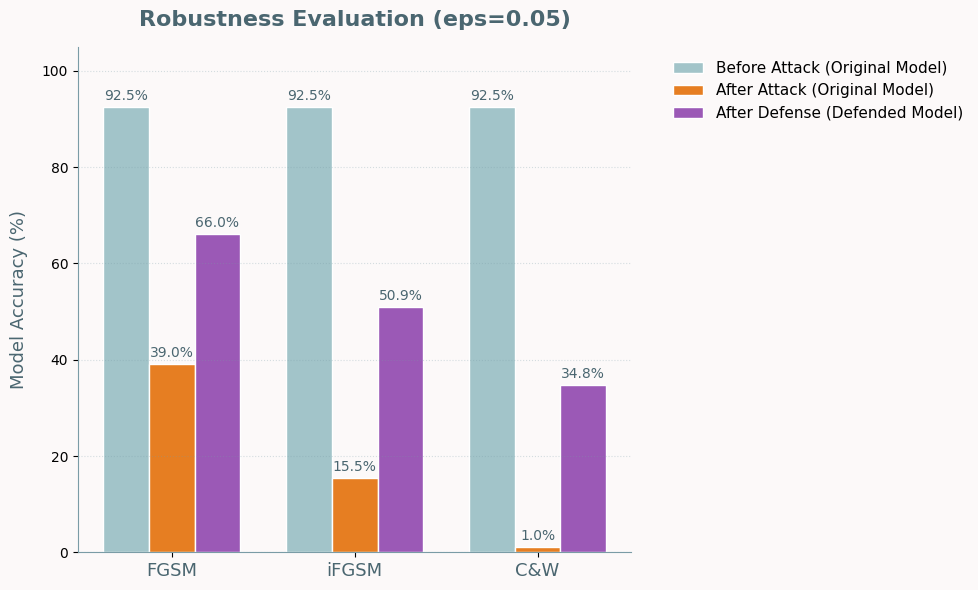

findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because 

✅ 3x3 比較圖表已儲存至 ./data/img/robustness_comparison.png


findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because 

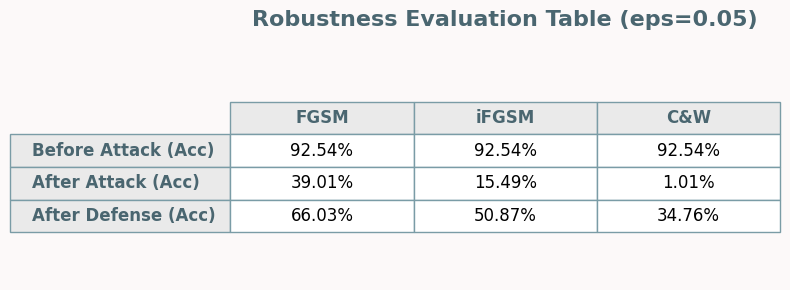

✅ 3x3 比較表格圖片已儲存至 ./data/img/robustness_table.png


In [45]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# 新增字體設定
plt.rcParams['font.sans-serif'] = ['Microsoft JhengHei']  # Windows 系統請用 'Microsoft JhengHei' (微軟正黑體)
# plt.rcParams['font.sans-serif'] = ['Arial Unicode MS']  # 如果您是 Mac 系統，請註解掉上一行，改用這行
plt.rcParams['axes.unicode_minus'] = False  # 確保圖表中的負號能正常顯示

print("\n========== 產生 3x3 攻擊與防禦成效比較表 ==========")

# 1. 準備模型
# 原始未防禦的模型 (只要載入一次)
# model_orig = load_model(pretrained_model_path, device)
# 這裡沿用環境中已有的 model_orig

# 設定固定的攻擊強度
eval_eps = [0.05]

# 2. 定義計算精準度的輔助函式
def get_clean_accuracy(eval_model, dataloader, dev):
    eval_model.eval()
    correct = 0
    total = 0
    with torch.no_grad():
        for data, target in dataloader:
            data, target = data.to(dev), target.to(dev)
            output = eval_model(data)
            pred = output.argmax(dim=1)
            correct += (pred == target).sum().item()
            total += target.size(0)
    return correct / total

# 【建議 ③】以原本的乾淨準確度作為評估基礎
acc_before = get_clean_accuracy(model_orig, test_dataloader, device)

# 我們用來儲存表格數據的字典
results_table = {
    "FGSM": [f"{acc_before*100:.2f}%", "", ""],
    "iFGSM": [f"{acc_before*100:.2f}%", "", ""],
    "C&W": [f"{acc_before*100:.2f}%", "", ""]
}

# 用來儲存畫圖用的數值資料 (百分比)
results_table_num = {
    "FGSM": [acc_before * 100, 0.0, 0.0],
    "iFGSM": [acc_before * 100, 0.0, 0.0],
    "C&W": [acc_before * 100, 0.0, 0.0]
}

# 3. 執行評估
attack_classes = [("FGSM", FGSMAttack, {}), 
                  ("iFGSM", IFGSMAttack, {'iters': 10}), 
                  ("C&W", CWAttack, {'iters': 50, 'lr': 0.01})]

for atk_name, AtkClass, kwargs in attack_classes:
    print(f"\n正在評估 {atk_name} ...")

    # --- 攻擊後 (After Attack) - 針對原始模型 ---
    atk_orig = run_attack(AtkClass, model_orig, eval_eps, test_dataloader, device, **kwargs)
    asr_orig = atk_orig.get_asr_data()[eval_eps[0]]

    # 原始模型的魯棒準確率
    acc_after_attack = acc_before * (1 - asr_orig)
    results_table[atk_name][1] = f"{acc_after_attack*100:.2f}%"
    results_table_num[atk_name][1] = acc_after_attack * 100

    # --- 防禦後 (After Defense) - 動態載入專屬的防禦模型 ---
    safe_atk_name = atk_name.replace("&", "")
    defended_model_path = f"./mnist/models/fashion_mnist_defended_{safe_atk_name.lower()}.pt"
    
    # 讀取專屬的防禦模型
    model_defended = load_model(defended_model_path, device)
    
    # 評估防禦模型遭受攻擊的 ASR
    atk_def = run_attack(AtkClass, model_defended, eval_eps, test_dataloader, device, **kwargs)
    asr_def = atk_def.get_asr_data()[eval_eps[0]]

    # 評估防禦模型的乾淨準確度
    acc_clean_def = get_clean_accuracy(model_defended, test_dataloader, device)
    
    # 【建議 ③】計算防禦後的絕對魯棒準確率 (Robust Accuracy)
    acc_after_defense = acc_clean_def * (1 - asr_def)
    results_table[atk_name][2] = f"{acc_after_defense*100:.2f}%"
    results_table_num[atk_name][2] = acc_after_defense * 100

# 4. 輸出成 DataFrame 與 Markdown
df = pd.DataFrame(results_table, index=["Before Attack (Acc)", "After Attack (Acc)", "After Defense (Acc)"])

print("\n================= 最終 3x3 比較表 (eps=0.05) =================")
print(df.to_markdown())
print("==============================================================\n")

# 5. 繪製並儲存圖表
labels = ['FGSM', 'iFGSM', 'C&W']
before_acc = [results_table_num[atk][0] for atk in labels]
after_acc = [results_table_num[atk][1] for atk in labels]
defended_acc = [results_table_num[atk][2] for atk in labels]

x = np.arange(len(labels))
width = 0.25

fig, ax = plt.subplots(figsize=(10, 6), facecolor='#FCF9F9')
ax.set_facecolor('#FCF9F9')

rects1 = ax.bar(x - width, before_acc, width, label='Before Attack (Original Model)', color='#A2C4C9', edgecolor='white')
rects2 = ax.bar(x, after_acc, width, label='After Attack (Original Model)', color='#E67E22', edgecolor='white')
rects3 = ax.bar(x + width, defended_acc, width, label='After Defense (Defended Model)', color='#9B59B6', edgecolor='white')

ax.set_ylabel('Model Accuracy (%)', fontsize=13, color='#4A6670', labelpad=10)
ax.set_title('Robustness Evaluation (eps=0.05)', fontsize=16, fontweight='bold', color='#4A6670', pad=15)
ax.set_xticks(x)
ax.set_xticklabels(labels, fontsize=13, color='#4A6670')
ax.set_ylim(0, 105)

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_color('#7A9CA6')
ax.spines['bottom'].set_color('#7A9CA6')
ax.grid(True, axis='y', linestyle=':', color='#7A9CA6', alpha=0.3, zorder=0)

# 標註數值
def autolabel(rects):
    for rect in rects:
        height = rect.get_height()
        ax.annotate(f'{height:.1f}%',
                    xy=(rect.get_x() + rect.get_width() / 2, height),
                    xytext=(0, 3), 
                    textcoords="offset points",
                    ha='center', va='bottom', fontsize=10, color='#4A6670')

autolabel(rects1)
autolabel(rects2)
autolabel(rects3)

plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=11, frameon=False)
plt.tight_layout()
plt.savefig('./data/img/robustness_comparison.png', dpi=300, facecolor='#FCF9F9')
plt.show()
print("✅ 3x3 比較圖表已儲存至 ./data/img/robustness_comparison.png")

# 6. 繪製並儲存表格圖片
fig, ax = plt.subplots(figsize=(8, 3), facecolor='#FCF9F9')
ax.axis('off')
table = ax.table(cellText=df.values, colLabels=df.columns, rowLabels=df.index, loc='center', cellLoc='center')
table.auto_set_font_size(False)
table.set_fontsize(12)
table.scale(1, 2)

for key, cell in table.get_celld().items():
    cell.set_edgecolor('#7A9CA6')
    if key[0] == 0 or key[1] == -1:
        cell.set_text_props(weight='bold', color='#4A6670')
        cell.set_facecolor('#EAEAEA')

plt.title('Robustness Evaluation Table (eps=0.05)', fontsize=16, fontweight='bold', color='#4A6670', pad=20)
plt.tight_layout()
plt.savefig('./data/img/robustness_table.png', dpi=300, facecolor='#FCF9F9', bbox_inches='tight')
plt.show()
print("✅ 3x3 比較表格圖片已儲存至 ./data/img/robustness_table.png")

In [46]:
#胡
print("\n========== 對抗性微調 (Adversarial Fine-tuning - 分別訓練) ==========")

# === 加入您指定的訓練集載入程式碼 ===
train_set = datasets.FashionMNIST('./mnist/data', train=True, download=True, 
                                  transform=transforms.ToTensor())
train_loader = DataLoader(train_set, batch_size=64, shuffle=True)
# ====================================

train_eps = 0.05
attacks_dict = {
    "FGSM": fgsm_attack,
    "iFGSM": ifgsm_attack,
    "CW": cw_attack
}

# ⚠️ 注意：這裡需要您原本未受污染的原始模型 (model_orig)
# 確保每次微調都是從同樣的起跑點開始，而不是拿已經被污染的模型繼續訓練
# model_orig = load_model(...) 
model_orig = copy.deepcopy(model)
for atk_name, atk_obj in attacks_dict.items():
    print(f"\n--- 正在進行 {atk_name} 的對抗性微調 ---")
    
    # 1. 取得單一攻擊手法的對抗樣本
    adv_images, adv_labels = atk_obj.get_retrain_data(eps=train_eps)
    
    if adv_images is None or len(adv_images) == 0:
        print(f"❌ 找不到 {atk_name} 的對抗樣本，跳過。")
        continue

    # 2. 收集乾淨樣本 (最多 10000 筆)
    clean_images = []
    clean_labels = []
    
    # 注意：這裡配合上方變數，已改為 train_loader
    for data, target in train_loader:
        clean_images.append(data)
        clean_labels.append(target)
        
    clean_images_tensor = torch.cat(clean_images, dim=0)
    clean_labels_tensor = torch.cat(clean_labels, dim=0)
    
    # 3. 強制 1:1 數量對齊 (取兩者中較小的數量，確保不失衡)
    min_size = min(len(adv_images), len(clean_images_tensor))
    
    adv_indices = torch.randperm(len(adv_images))[:min_size]
    clean_indices = torch.randperm(len(clean_images_tensor))[:min_size]
    
    final_adv_images = adv_images[adv_indices]
    final_adv_labels = adv_labels[adv_indices]
    final_clean_images = clean_images_tensor[clean_indices]
    final_clean_labels = clean_labels_tensor[clean_indices]
    
    print(f"🚩 {atk_name}: 對抗樣本 {min_size} 筆 + 乾淨樣本 {min_size} 筆。")
    
    mixed_images = torch.cat([final_adv_images, final_clean_images], dim=0)
    mixed_labels = torch.cat([final_adv_labels, final_clean_labels], dim=0)
    
    retrain_dataset = TensorDataset(mixed_images, mixed_labels)
    retrain_loader = DataLoader(retrain_dataset, batch_size=64, shuffle=True)
    
    # 4. 重新拷貝一個乾淨的模型進行訓練
    defended_model = copy.deepcopy(model_orig)
    defended_model.train()
    defended_model.to(device)
    
    optimizer = optim.Adam(defended_model.parameters(), lr=1e-4)
    criterion = nn.CrossEntropyLoss()
    
    epochs = 3
    for epoch in range(epochs):
        current_loss = 0.0
        for images, labels in retrain_loader:
            images, labels = images.to(device), labels.to(device)
            optimizer.zero_grad()
            outputs = defended_model(images)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()
            current_loss += loss.item()
        print(f"Epoch {epoch+1}/{epochs}, Loss: {current_loss/len(retrain_loader):.4f}")
        
    # 5. 獨立儲存該攻擊專屬的防禦模型
    save_path = f"./mnist/models/fashion_mnist_defended_{atk_name.lower()}.pt"
    torch.save(defended_model.state_dict(), save_path)
    print(f"✅ {atk_name} 防禦模型已儲存至 {save_path}")


========== 對抗性微調 (Adversarial Fine-tuning - 分別訓練) ==========

--- 正在進行 FGSM 的對抗性微調 ---
🚩 FGSM: 對抗樣本 5353 筆 + 乾淨樣本 5353 筆。


/home/karla/miniconda3/envs/fgsm_mnist/lib/python3.10/site-packages/torch/nn/modules/dropout.py:176: UserWarning: dropout2d: Received a 2-D input to dropout2d, which is deprecated and will result in an error in a future release. To retain the behavior and silence this warning, please use dropout instead. Note that dropout2d exists to provide channel-wise dropout on inputs with 2 spatial dimensions, a channel dimension, and an optional batch dimension (i.e. 3D or 4D inputs).
  return F.dropout2d(input, self.p, self.training, self.inplace)


Epoch 1/3, Loss: 7.9568
Epoch 2/3, Loss: 3.3131
Epoch 3/3, Loss: 1.9737
✅ FGSM 防禦模型已儲存至 ./mnist/models/fashion_mnist_defended_fgsm.pt

--- 正在進行 iFGSM 的對抗性微調 ---
🚩 iFGSM: 對抗樣本 7705 筆 + 乾淨樣本 7705 筆。
Epoch 1/3, Loss: 8.5571
Epoch 2/3, Loss: 2.2989
Epoch 3/3, Loss: 1.4670
✅ iFGSM 防禦模型已儲存至 ./mnist/models/fashion_mnist_defended_ifgsm.pt

--- 正在進行 CW 的對抗性微調 ---
🚩 CW: 對抗樣本 9153 筆 + 乾淨樣本 9153 筆。
Epoch 1/3, Loss: 2.5439
Epoch 2/3, Loss: 1.2076
Epoch 3/3, Loss: 0.8829
✅ CW 防禦模型已儲存至 ./mnist/models/fashion_mnist_defended_cw.pt



========== 產生 3x3 攻擊與防禦成效比較表 ==========
Loading model from ./mnist/models/fashion_mnist_cnn_no_dropout.pt...
Model loaded successfully.

正在評估 FGSM ...

--- Running FGSMAttack ---
Epsilon: 0.05	Attack Success Rate = 5353 / 9254 = 0.5785
Loading model from ./mnist/models/fashion_mnist_defended_fgsm.pt...
Model loaded successfully.

--- Running FGSMAttack ---
Epsilon: 0.05	Attack Success Rate = 5260 / 8621 = 0.6101

正在評估 iFGSM ...

--- Running IFGSMAttack ---
Epsilon: 0.05	Iter: 10	Attack Success Rate = 7705 / 9254 = 0.8326
Loading model from ./mnist/models/fashion_mnist_defended_ifgsm.pt...
Model loaded successfully.

--- Running IFGSMAttack ---
Epsilon: 0.05	Iter: 10	Attack Success Rate = 5672 / 8650 = 0.6557

正在評估 C&W ...

--- Running CWAttack ---
Epsilon: 0.05	Iter: 50	Attack Success Rate = 9153 / 9254 = 0.9891
Loading model from ./mnist/models/fashion_mnist_defended_cw.pt...
Model loaded successfully.

--- Running CWAttack ---
Epsilon: 0.05	Iter: 50	Attack Success Rate = 6774 / 9007

findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because 


================= 最終 3x3 比較表 (eps=0.05) =================
|                     | FGSM   | iFGSM   | C&W    |
|:--------------------|:-------|:--------|:-------|
| Before Attack (Acc) | 92.54% | 92.54%  | 92.54% |
| After Attack (Acc)  | 39.01% | 15.49%  | 1.01%  |
| After Defense (Acc) | 33.61% | 29.78%  | 22.33% |



findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because 

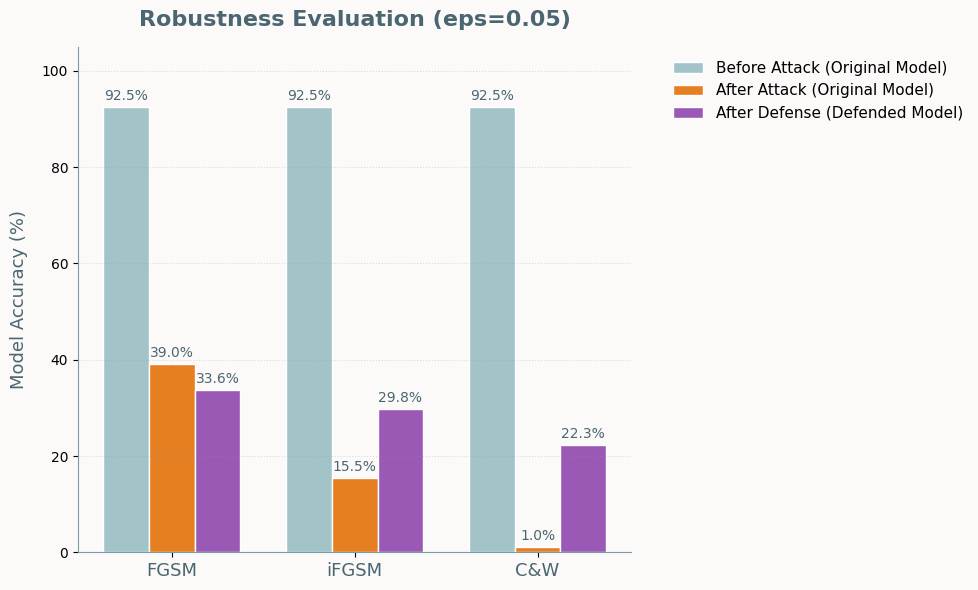

findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because 

✅ 3x3 比較圖表已儲存至 ./data/img/robustness_comparison.png


findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: Microsoft JhengHei
findfont: Generic family 'sans-serif' not found because 

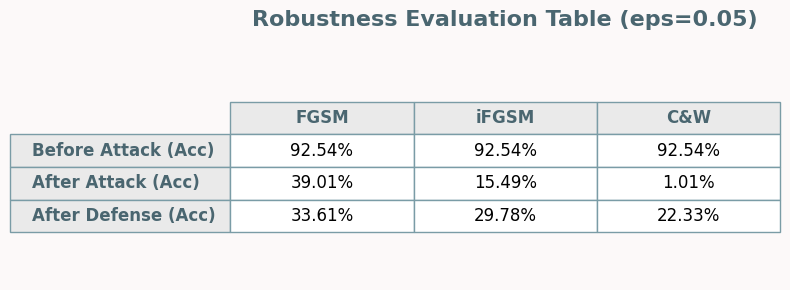

✅ 3x3 比較表格圖片已儲存至 ./data/img/robustness_table.png


In [47]:
# 新增字體設定
plt.rcParams['font.sans-serif'] = ['Microsoft JhengHei']  # Windows 系統請用 'Microsoft JhengHei' (微軟正黑體)
# plt.rcParams['font.sans-serif'] = ['Arial Unicode MS']  # 如果您是 Mac 系統，請註解掉上一行，改用這行
plt.rcParams['axes.unicode_minus'] = False  # 確保圖表中的負號能正常顯示

# 新增字體設定
plt.rcParams['font.sans-serif'] = ['Microsoft JhengHei']  # Windows 系統請用 'Microsoft JhengHei' (微軟正黑體)
# plt.rcParams['font.sans-serif'] = ['Arial Unicode MS']  # 如果您是 Mac 系統，請註解掉上一行，改用這行
plt.rcParams['axes.unicode_minus'] = False  # 確保圖表中的負號能正常顯示

print("\n========== 產生 3x3 攻擊與防禦成效比較表 ==========")

# 1. 準備模型
# 原始未防禦的模型 (只要載入一次)
model_orig = load_model(pretrained_model_path, device)

# 設定固定的攻擊強度
eval_eps = [0.05]

# 2. 定義計算精準度的輔助函式
def get_clean_accuracy(eval_model, dataloader, dev):
    eval_model.eval()
    correct = 0
    total = 0
    with torch.no_grad():
        for data, target in dataloader:
            data, target = data.to(dev), target.to(dev)
            output = eval_model(data)
            pred = output.argmax(dim=1)
            correct += (pred == target).sum().item()
            total += target.size(0)
    return correct / total

# 計算攻擊前準確度 (Clean Accuracy)
acc_before = get_clean_accuracy(model_orig, test_dataloader, device)

# 我們用來儲存表格數據的字典
results_table = {
    "FGSM": [f"{acc_before*100:.2f}%", "", ""],
    "iFGSM": [f"{acc_before*100:.2f}%", "", ""],
    "C&W": [f"{acc_before*100:.2f}%", "", ""]
}

# 用來儲存畫圖用的數值資料 (百分比)
results_table_num = {
    "FGSM": [acc_before * 100, 0.0, 0.0],
    "iFGSM": [acc_before * 100, 0.0, 0.0],
    "C&W": [acc_before * 100, 0.0, 0.0]
}

# 3. 執行評估
attack_classes = [("FGSM", FGSMAttack, {}), 
                  ("iFGSM", IFGSMAttack, {'iters': 10}), 
                  ("C&W", CWAttack, {'iters': 50, 'lr': 0.01})]

for atk_name, AtkClass, kwargs in attack_classes:
    print(f"\n正在評估 {atk_name} ...")

    # --- 攻擊後 (After Attack) - 針對原始模型 ---
    atk_orig = run_attack(AtkClass, model_orig, eval_eps, test_dataloader, device, **kwargs)
    asr_orig = atk_orig.get_asr_data()[eval_eps[0]]

    acc_after_attack = acc_before * (1 - asr_orig)
    results_table[atk_name][1] = f"{acc_after_attack*100:.2f}%"
    results_table_num[atk_name][1] = acc_after_attack * 100

    # --- 防禦後 (After Defense) - 動態載入專屬的防禦模型 ---
    # 處理檔名對應問題 (C&W -> cw)
    safe_atk_name = atk_name.replace("&", "")
    defended_model_path = f"./mnist/models/fashion_mnist_defended_{safe_atk_name.lower()}.pt"
    
    # 讀取專屬的防禦模型
    model_defended = load_model(defended_model_path, device)
    
    atk_def = run_attack(AtkClass, model_defended, eval_eps, test_dataloader, device, **kwargs)
    asr_def = atk_def.get_asr_data()[eval_eps[0]]

    acc_clean_def = get_clean_accuracy(model_defended, test_dataloader, device)
    acc_after_defense = acc_clean_def * (1 - asr_def)
    results_table[atk_name][2] = f"{acc_after_defense*100:.2f}%"
    results_table_num[atk_name][2] = acc_after_defense * 100

# 4. 輸出成 DataFrame 與 Markdown
# (已將此區塊移出迴圈外，避免重複執行)
df = pd.DataFrame(results_table, index=["Before Attack (Acc)", "After Attack (Acc)", "After Defense (Acc)"])

print("\n================= 最終 3x3 比較表 (eps=0.05) =================")
print(df.to_markdown())
print("==============================================================\n")

# 5. 繪製並儲存圖表
labels = ['FGSM', 'iFGSM', 'C&W']
before_acc = [results_table_num[atk][0] for atk in labels]
after_acc = [results_table_num[atk][1] for atk in labels]
defended_acc = [results_table_num[atk][2] for atk in labels]

x = np.arange(len(labels))
width = 0.25

fig, ax = plt.subplots(figsize=(10, 6), facecolor='#FCF9F9')
ax.set_facecolor('#FCF9F9')

rects1 = ax.bar(x - width, before_acc, width, label='Before Attack (Original Model)', color='#A2C4C9', edgecolor='white')
rects2 = ax.bar(x, after_acc, width, label='After Attack (Original Model)', color='#E67E22', edgecolor='white')
rects3 = ax.bar(x + width, defended_acc, width, label='After Defense (Defended Model)', color='#9B59B6', edgecolor='white')

ax.set_ylabel('Model Accuracy (%)', fontsize=13, color='#4A6670', labelpad=10)
ax.set_title('Robustness Evaluation (eps=0.05)', fontsize=16, fontweight='bold', color='#4A6670', pad=15)
ax.set_xticks(x)
ax.set_xticklabels(labels, fontsize=13, color='#4A6670')
ax.set_ylim(0, 105)

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_color('#7A9CA6')
ax.spines['bottom'].set_color('#7A9CA6')
ax.grid(True, axis='y', linestyle=':', color='#7A9CA6', alpha=0.3, zorder=0)

# 標註數值
def autolabel(rects):
    for rect in rects:
        height = rect.get_height()
        ax.annotate(f'{height:.1f}%',
                    xy=(rect.get_x() + rect.get_width() / 2, height),
                    xytext=(0, 3),  # 3 points vertical offset
                    textcoords="offset points",
                    ha='center', va='bottom', fontsize=10, color='#4A6670')

autolabel(rects1)
autolabel(rects2)
autolabel(rects3)

plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=11, frameon=False)
plt.tight_layout()
plt.savefig('./data/img/robustness_comparison.png', dpi=300, facecolor='#FCF9F9')
plt.show()
print("✅ 3x3 比較圖表已儲存至 ./data/img/robustness_comparison.png")

# 6. 繪製並儲存表格圖片
fig, ax = plt.subplots(figsize=(8, 3), facecolor='#FCF9F9')
ax.axis('off')
table = ax.table(cellText=df.values, colLabels=df.columns, rowLabels=df.index, loc='center', cellLoc='center')
table.auto_set_font_size(False)
table.set_fontsize(12)
table.scale(1, 2)

for key, cell in table.get_celld().items():
    cell.set_edgecolor('#7A9CA6')
    if key[0] == 0 or key[1] == -1:
        cell.set_text_props(weight='bold', color='#4A6670')
        cell.set_facecolor('#EAEAEA')

plt.title('Robustness Evaluation Table (eps=0.05)', fontsize=16, fontweight='bold', color='#4A6670', pad=20)
plt.tight_layout()
plt.savefig('./data/img/robustness_table.png', dpi=300, facecolor='#FCF9F9', bbox_inches='tight')
plt.show()
print("✅ 3x3 比較表格圖片已儲存至 ./data/img/robustness_table.png")